# Importing necessary libraries

In [289]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.express as px
import plotly.express as px
import re
from matplotlib.colors import is_color_like
from scipy.stats import skew

%matplotlib inline

In [2]:
import warnings
warnings.simplefilter(action='ignore')

In [3]:
sns.set_style('darkgrid')

In [4]:
df = pd.read_csv('train.csv', index_col = 'id')

# EDA

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 188533 entries, 0 to 188532
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   brand         188533 non-null  object
 1   model         188533 non-null  object
 2   model_year    188533 non-null  int64 
 3   milage        188533 non-null  int64 
 4   fuel_type     183450 non-null  object
 5   engine        188533 non-null  object
 6   transmission  188533 non-null  object
 7   ext_col       188533 non-null  object
 8   int_col       188533 non-null  object
 9   accident      186081 non-null  object
 10  clean_title   167114 non-null  object
 11  price         188533 non-null  int64 
dtypes: int64(3), object(9)
memory usage: 18.7+ MB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
model_year,188533.0,2015.829998,5.660967,1974.0,2013.0,2017.0,2020.0,2024.0
milage,188533.0,65705.295174,49798.158076,100.0,24115.0,57785.0,95400.0,405000.0
price,188533.0,43878.016178,78819.522254,2000.0,17000.0,30825.0,49900.0,2954083.0


<Axes: >

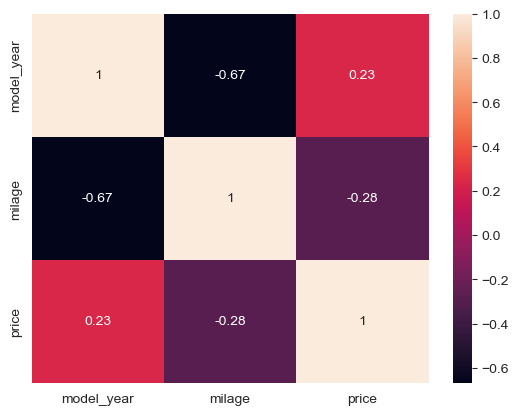

In [7]:
sns.heatmap(df.corr(numeric_only=True), annot = True)

<Axes: ylabel='price'>

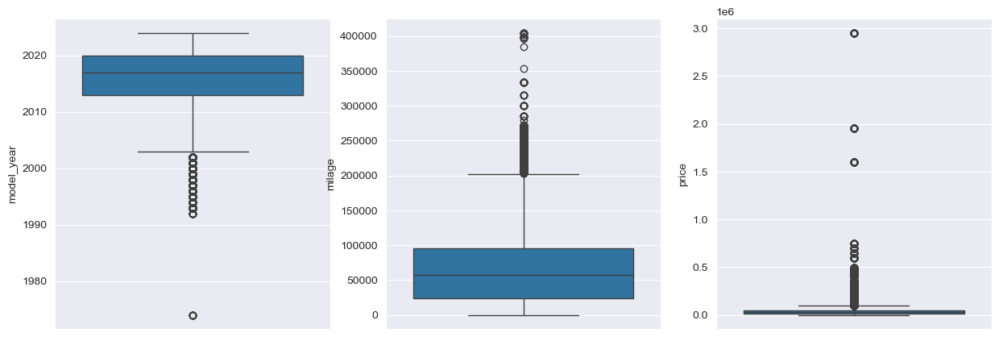

In [8]:
plt.figure(figsize = (15,5))
plt.subplot(1,3,1)
sns.boxplot(df['model_year'])
plt.subplot(1,3,2)
sns.boxplot(df['milage'])
plt.subplot(1,3,3)
sns.boxplot(df['price'])

#### Price vs brand investigation

In [9]:
df_brand = df.groupby('brand')['price'].agg(['mean', 'count']).sort_values('count', ascending = False)

In [10]:
df_brand.head(2)

,mean,count
brand,,
Ford,40511.969508,23088
Mercedes-Benz,51244.399541,19172


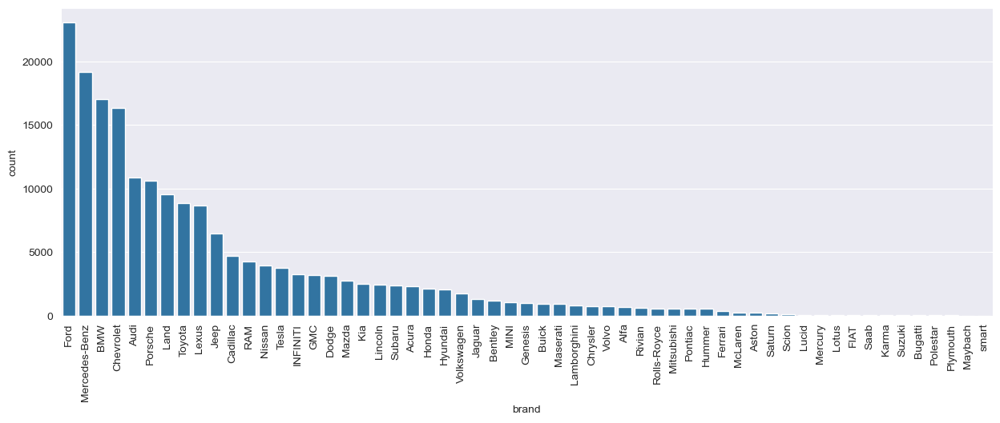

In [11]:
plt.figure(figsize = (15,5))
sns.barplot(x = df_brand.index, y = df_brand['count'] )
plt.xticks(rotation = 90)
plt.show()

In [12]:
plt.figure(figsize = (15,15))
px.bar(df['brand'].value_counts(), x = df['brand'].value_counts().index, y = df['brand'].value_counts(), text='count')

<Figure size 1500x1500 with 0 Axes>

In [13]:
plt.figure(figsize = (15,10))
px.bar(df_brand, x = df_brand.index, y = 'mean', text='count')

<Figure size 1500x1000 with 0 Axes>

#### Price vs model investigation

In [14]:
df_model = df.groupby(['brand', 'model'])['price'].agg(['count','mean']).sort_values(by = 'count',ascending=False).reset_index().iloc[:30]

In [15]:
df_model.head()

,brand,model,count,mean
0,Ford,F-150 XLT,2934,42712.395024
1,BMW,M3 Base,2195,38186.541686
2,Chevrolet,Camaro 2SS,1699,35919.360800
3,BMW,M4 Base,1608,58481.208955
4,Ford,Mustang GT Premium,1515,32865.363036


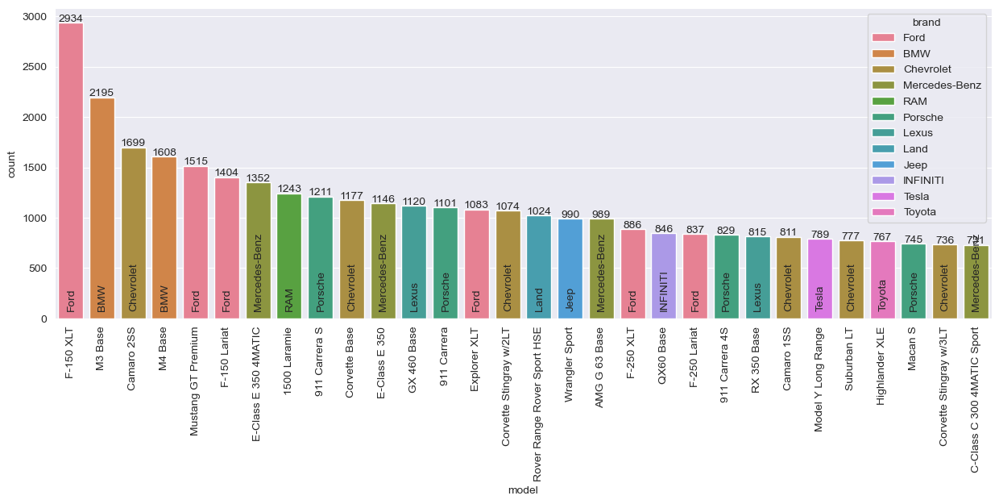

In [16]:
plt.figure(figsize = (15,5))
sns.barplot(df_model, x = 'model', y = 'count', hue = 'brand')
for i, r in df_model.iterrows():
    plt.text(x=i, y=r['count']+10 , s=str(r['count']), ha='center')
    plt.text(x=i+0.02, y=100 , s=r['brand'], ha='center', rotation = 90)
    
plt.xticks(rotation = 90)
plt.show()

In [17]:
fig = px.bar(df_model, x = 'model', y='count' , text='brand')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

#### Price vs model_year investigation

In [18]:
df_year = df.groupby(['model_year'])['price'].agg(['count','mean']).sort_values(by = 'count',ascending=False).reset_index()

In [19]:
df_year.head(2)

,model_year,count,mean
0,2021,18198,65893.857951
1,2018,16414,47707.568722


In [20]:
df_year['model_year'] = df_year['model_year'].astype('str')

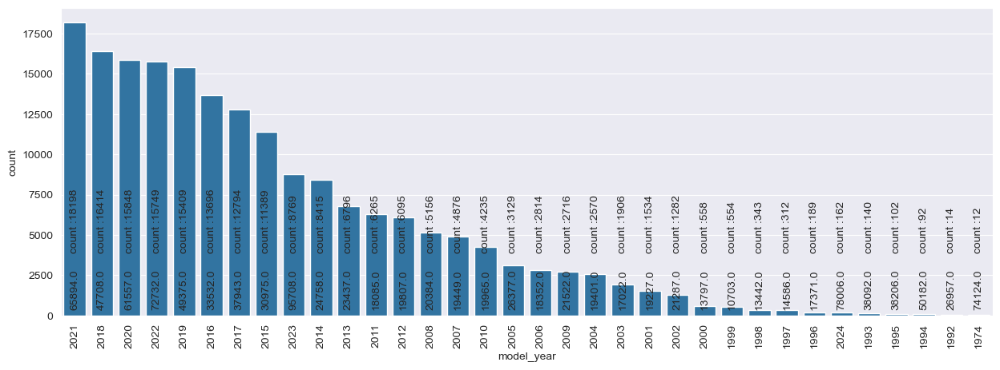

In [21]:
plt.figure(figsize = (15,5))
sns.barplot(df_year, x = df_year['model_year'], y = 'count')
for i,r in df_year.iterrows():
    plt.text(x = i , y = 500, s = np.round(r['mean']), ha= 'center', rotation = 90) 
    plt.text(x = i , y = 4000, s = 'count :'+ str(r['count']), ha= 'center', rotation = 90) 
plt.xticks(rotation = 90)
plt.show()

### price vs milage investigation

Text(0.5, 0, 'milage histogram')

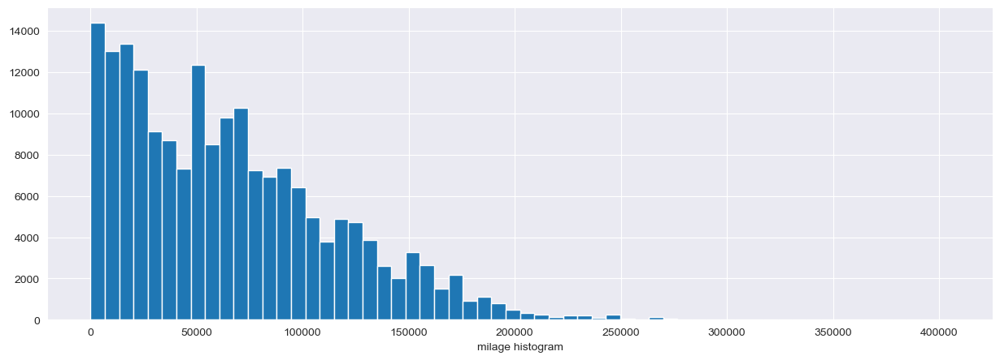

In [22]:
plt.figure(figsize = (15,5))
df['milage'].hist(bins = 60)
plt.xlabel('milage histogram')

<Axes: xlabel='model_year'>

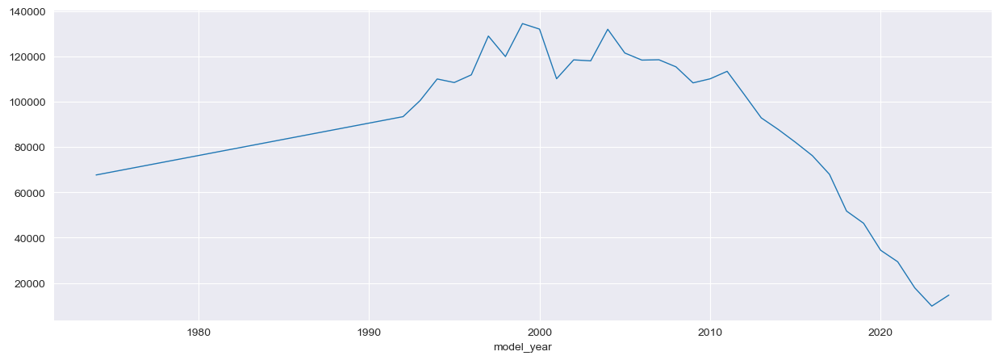

In [23]:
df.groupby('model_year')['milage'].mean().plot.line(x = 'model_year', y = 'milage',figsize=(15,5),lw=1)

<Axes: xlabel='model_year'>

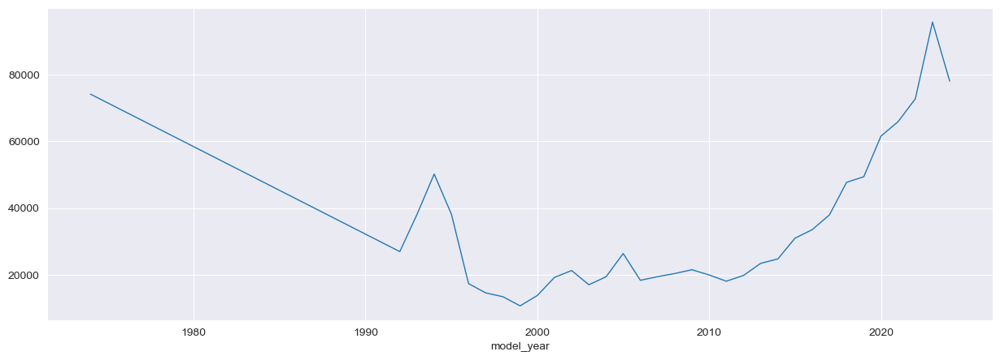

In [24]:
df.groupby('model_year')['price'].mean().plot.line(x = 'model_year', y = 'price',figsize=(15,5),lw=1)

In [25]:
iqr = df['price'].quantile(0.75) - df['price'].quantile(0.25) 
upper_bound = df['price'].quantile(0.75) + 1.5 * iqr
lower_bound = df['price'].quantile(0.25) - 1.5 * iqr
print('IQR :' , iqr)
print('upper boundry for price :' , upper_bound)
print('lower boundry for price :' , lower_bound)

IQR : 32900.0
upper boundry for price : 99250.0
lower boundry for price : -32350.0


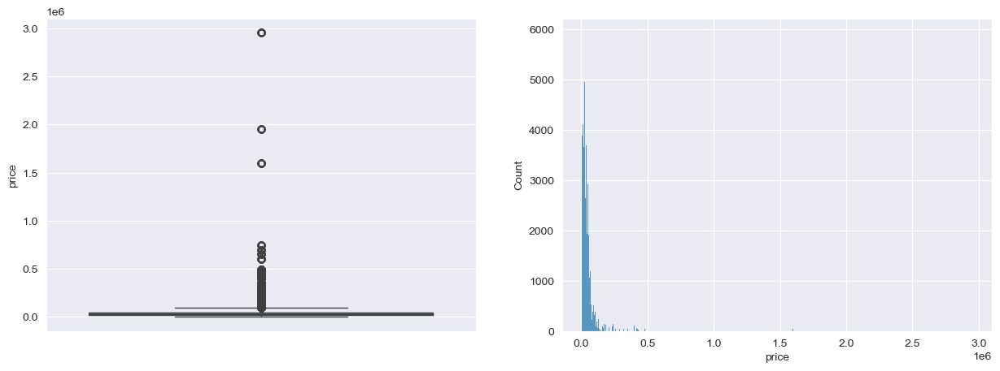

In [26]:
plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
sns.boxplot(df['price'])
plt.subplot(1,2,2)
sns.histplot(df['price'])
plt.show()

In [27]:
print('no of unique car brands :' , df['brand'].nunique())
print('no of unique car models :' , df['model'].nunique())

no of unique car brands : 57
no of unique car models : 1897


# Data Preprocessing

In [28]:
df_train = pd.read_csv('train.csv', index_col = 'id')

In [29]:
df_test = pd.read_csv('test.csv', index_col = 'id')

In [30]:
df_train.head()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
id,,,,,,,,,,,,
0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes,4200
1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes,4999
2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes,13900
3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,45000
4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes,97500


In [31]:
df_test.head()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,
188533,Land,Rover LR2 Base,2015,98000,Gasoline,240.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,6-Speed A/T,White,Beige,None reported,Yes
188534,Land,Rover Defender SE,2020,9142,Hybrid,395.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,8-Speed A/T,Silver,Black,None reported,Yes
188535,Ford,Expedition Limited,2022,28121,Gasoline,3.5L V6 24V PDI DOHC Twin Turbo,10-Speed Automatic,White,Ebony,None reported,NaN
188536,Audi,A6 2.0T Sport,2016,61258,Gasoline,2.0 Liter TFSI,Automatic,Silician Yellow,Black,None reported,NaN
188537,Audi,A6 2.0T Premium Plus,2018,59000,Gasoline,252.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,A/T,Gray,Black,None reported,Yes


In [32]:
print('The size of Train Dataset :', df_train.shape)
print('The size of Test Dataset :', df_test.shape)

The size of Train Dataset : (188533, 12)
The size of Test Dataset : (125690, 11)


In [33]:
y= df_train['price']

In [34]:
df1 = pd.concat([df_train.drop('price', axis = 1), df_test], axis = 0)

In [35]:
df1.head()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,
0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes
1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes
2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes
3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes
4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes


In [36]:
df1.tail()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,
314218,Mercedes-Benz,GL-Class GL 450 4MATIC,2014,83315,Gasoline,362.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Black,None reported,Yes
314219,Audi,Q7 55 Prestige,2019,29336,Gasoline,3.0 Liter Turbo,Automatic,White,Black,None reported,NaN
314220,Audi,A6 3.0T Premium Plus,2012,77634,Gasoline,333.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,A/T,Black,Black,None reported,Yes
314221,Audi,Q7 3.0T Premium,2012,112000,Gasoline,333.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,A/T,Black,Black,None reported,Yes
314222,Chevrolet,Tahoe LT,2018,66840,Gasoline,355.0HP 5.3L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Black,None reported,Yes


In [37]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 314223 entries, 0 to 314222
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   brand         314223 non-null  object
 1   model         314223 non-null  object
 2   model_year    314223 non-null  int64 
 3   milage        314223 non-null  int64 
 4   fuel_type     305757 non-null  object
 5   engine        314223 non-null  object
 6   transmission  314223 non-null  object
 7   ext_col       314223 non-null  object
 8   int_col       314223 non-null  object
 9   accident      310139 non-null  object
 10  clean_title   278565 non-null  object
dtypes: int64(2), object(9)
memory usage: 28.8+ MB


#### Adding the 'car_age' column

In [38]:
car_age = pd.Series(data = 2025-df1['model_year'], index = df1.index)
car_age.head()

id
0    18
1    23
2    23
3     8
4     4
Name: model_year, dtype: int64

In [39]:
df1.insert( 3 , column='car_age', value = car_age.values )

In [40]:
df1.head()

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,,
0,MINI,Cooper S Base,2007,18,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes
1,Lincoln,LS V8,2002,23,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes
2,Chevrolet,Silverado 2500 LT,2002,23,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes
3,Genesis,G90 5.0 Ultimate,2017,8,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes
4,Mercedes-Benz,Metris Base,2021,4,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes


In [41]:
px.histogram(df1['car_age'], text_auto='.2s',opacity=0.5 )

In [42]:
df1['fuel_type'].value_counts()

fuel_type
Gasoline          276473
Hybrid             11508
E85 Flex Fuel       8929
Diesel              6641
–                   1319
Plug-In Hybrid       858
not supported         29
Name: count, dtype: int64

In [43]:
px.bar(x =df1['fuel_type'].value_counts().index , y =df1['fuel_type'].value_counts(), text_auto='.2s')

### checking the 'fuel_type' column

#### handling the' non-supported' values in the 'fuel_type' column and setting them accrding to the engine

In [44]:
df1[df1['fuel_type'] == 'not supported']

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,,
4823,Chevrolet,Suburban LT,2011,14,109646,not supported,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,6-Speed A/T,Black,Beige,None reported,Yes
18000,Porsche,Camaro 2SS,2015,10,67000,not supported,240.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes
19182,Nissan,Mirai Limited,2000,25,131000,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Silver,Black,None reported,Yes
27199,Subaru,Outback 2.5i Limited,2017,8,116000,not supported,175.0HP 2.5L 4 Cylinder Engine Gasoline Fuel,CVT Transmission,Gray,Black,At least 1 accident or damage reported,Yes
33030,Nissan,Mirai Limited,2009,16,137333,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,White,Gray,At least 1 accident or damage reported,Yes
60717,Chevrolet,Silverado 1500 RST,2020,5,19200,not supported,355.0HP 5.3L 8 Cylinder Engine Gasoline Fuel,10-Speed A/T,White,Black,At least 1 accident or damage reported,Yes
74096,Toyota,Mirai Limited,2021,4,79876,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Red,Black,None reported,Yes
86897,Lexus,IS 350 F Sport,2022,3,9500,not supported,311.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,A/T,Gray,Black,None reported,Yes
94425,Porsche,Cayenne Turbo GT,2018,7,52000,not supported,550.0HP 4.8L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Gray,Gray,At least 1 accident or damage reported,Yes


In [45]:
len(df1[df1['fuel_type'] == 'not supported'])

29

In [46]:
len(df1[df1['fuel_type'] == 'not supported']['model'].unique())

18

In [47]:
df1[df1['fuel_type'] == 'not supported'].groupby(['model','brand' ,'model_year']).count()

,,,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
model,brand,model_year,,,,,,,,,
A3 2.0T Premium,Audi,2015,1,1,1,1,1,1,1,1,1
Camaro 2SS,Porsche,2015,1,1,1,1,1,1,1,1,1
Cayenne Turbo GT,Porsche,2018,1,1,1,1,1,1,1,1,1
Corvette Stingray w/2LT,Chevrolet,2018,1,1,1,1,1,1,1,1,1
Escalade ESV Sport,Cadillac,2018,1,1,1,1,1,1,1,1,1
Focus ST Base,Ford,2018,1,1,1,1,1,1,1,1,1
H2 Base,Hummer,2013,1,1,1,1,1,1,1,1,1
IS 350 F Sport,Lexus,2022,1,1,1,1,1,1,1,1,1
MX-5 Miata Base,Mazda,1999,1,1,1,1,1,1,1,1,1


In [48]:
df1[df1['model'] == 'Mirai Limited']

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,,
19182,Nissan,Mirai Limited,2000,25,131000,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Silver,Black,None reported,Yes
23138,Toyota,Mirai Limited,1993,32,28800,NaN,182.0HP Electric Motor Hydrogen Fuel,A/T,Gold,Gold,None reported,Yes
33030,Nissan,Mirai Limited,2009,16,137333,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,White,Gray,At least 1 accident or damage reported,Yes
58674,Toyota,Mirai Limited,2005,20,69764,Gasoline,130.0HP 1.8L 4 Cylinder Engine Gasoline Fuel,5-Speed M/T,White,Beige,None reported,Yes
74096,Toyota,Mirai Limited,2021,4,79876,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Red,Black,None reported,Yes
127066,Toyota,Mirai Limited,2016,9,58664,not supported,151.0HP Electric Motor Hydrogen Fuel,CVT Transmission,Black,Black,At least 1 accident or damage reported,Yes
135865,Lexus,Mirai Limited,2014,11,123331,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Red,Gray,At least 1 accident or damage reported,Yes
171659,Toyota,Mirai Limited,2021,4,44000,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Gray,Black,None reported,Yes
186307,Nissan,Mirai Limited,2020,5,95170,Gasoline,182.0HP Electric Motor Hydrogen Fuel,1-Speed A/T,Gray,Black,At least 1 accident or damage reported,Yes


In [49]:
df1.loc[df1['model'] == 'Mirai Limited', 'brand'] = 'Toyota'

In [50]:
df1[df1['fuel_type'] == 'not supported'].groupby(['model','brand' ,'model_year']).count()

,,,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
model,brand,model_year,,,,,,,,,
A3 2.0T Premium,Audi,2015,1,1,1,1,1,1,1,1,1
Camaro 2SS,Porsche,2015,1,1,1,1,1,1,1,1,1
Cayenne Turbo GT,Porsche,2018,1,1,1,1,1,1,1,1,1
Corvette Stingray w/2LT,Chevrolet,2018,1,1,1,1,1,1,1,1,1
Escalade ESV Sport,Cadillac,2018,1,1,1,1,1,1,1,1,1
Focus ST Base,Ford,2018,1,1,1,1,1,1,1,1,1
H2 Base,Hummer,2013,1,1,1,1,1,1,1,1,1
IS 350 F Sport,Lexus,2022,1,1,1,1,1,1,1,1,1
MX-5 Miata Base,Mazda,1999,1,1,1,1,1,1,1,1,1


In [51]:
df1.loc[(df1['model'] == 'Mirai Limited') | (df1['model'] == 'Mirai Base')]

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,,
18025,Toyota,Mirai Base,2018,7,62500,Gasoline,151.0HP Electric Motor Hydrogen Fuel,A/T,Green,Black,None reported,Yes
19182,Toyota,Mirai Limited,2000,25,131000,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Silver,Black,None reported,Yes
23138,Toyota,Mirai Limited,1993,32,28800,NaN,182.0HP Electric Motor Hydrogen Fuel,A/T,Gold,Gold,None reported,Yes
33030,Toyota,Mirai Limited,2009,16,137333,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,White,Gray,At least 1 accident or damage reported,Yes
35079,Toyota,Mirai Base,2013,12,116000,Gasoline,151.0HP Electric Motor Hydrogen Fuel,A/T,Silver,Black,At least 1 accident or damage reported,Yes
58674,Toyota,Mirai Limited,2005,20,69764,Gasoline,130.0HP 1.8L 4 Cylinder Engine Gasoline Fuel,5-Speed M/T,White,Beige,None reported,Yes
74096,Toyota,Mirai Limited,2021,4,79876,not supported,182.0HP Electric Motor Hydrogen Fuel,A/T,Red,Black,None reported,Yes
97368,Toyota,Mirai Base,2015,10,87000,Gasoline,151.0HP Electric Motor Hydrogen Fuel,A/T,White,Black,NaN,NaN
112609,Toyota,Mirai Base,2018,7,62600,Gasoline,182.0HP Electric Motor Hydrogen Fuel,Transmission w/Dual Shift Mode,Yellow,Black,At least 1 accident or damage reported,Yes


In [52]:
print('No. of na values in Fuel_type column :', df1['fuel_type'].isna().sum())

No. of na values in Fuel_type column : 8466


In [53]:
df1['fuel_type'].unique()

array(['Gasoline', 'E85 Flex Fuel', nan, 'Hybrid', 'Diesel',
       'Plug-In Hybrid', '–', 'not supported'], dtype=object)

'not Supported' be a category so we will leave i  as it is
most probably it represents Hydrogyn Fuel

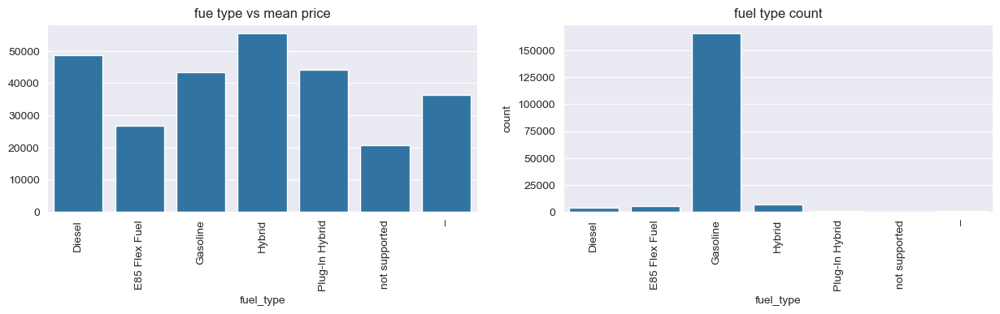

In [54]:
plt.figure(figsize=(15,3))
plt.subplot(1,2,1)
sns.barplot(x = df_train.groupby('fuel_type')['price'].mean().index, y = df_train.groupby('fuel_type')['price'].mean().values )
plt.title('fue type vs mean price')
plt.xticks(rotation = 90)
plt.subplot(1,2,2)
sns.countplot(data = df_train , x = df_train['fuel_type'] , order =  df_train.groupby('fuel_type')['price'].mean().index)
plt.title('fuel type count')
plt.xticks(rotation = 90)
plt.show()

In [55]:
print('no of instances with na for fuel_type :' , len(df1.loc[df1['fuel_type'].isna()] ))

no of instances with na for fuel_type : 8466


In [56]:
df1.loc[df1['fuel_type'].isna(), 'brand'].unique()

array(['Tesla', 'Porsche', 'Nissan', 'Chevrolet', 'Ford', 'Rivian',
       'smart', 'Mercedes-Benz', 'Kia', 'Lucid', 'Audi', 'Karma',
       'Hyundai', 'BMW', 'Dodge', 'Volkswagen', 'Maserati', 'Toyota',
       'Ferrari', 'Jeep', 'Pontiac', 'Polestar', 'Acura', 'Land',
       'Genesis', 'GMC', 'Chrysler', 'FIAT', 'McLaren', 'Cadillac', 'RAM',
       'Volvo', 'Bentley', 'Lotus', 'MINI', 'INFINITI', 'Mitsubishi',
       'Jaguar', 'Lamborghini', 'Lincoln', 'Alfa', 'Subaru', 'Aston',
       'Rolls-Royce', 'Mazda', 'Lexus', 'Honda'], dtype=object)

#### Supplying 'Electric' for guel_type for electric car brsnds ['Tesla', 'Rivian', 'Lucid', 'Karma' , 'Polestar']
#### Supplying 'Electric' for guel_type if the word 'Electric' is in engine name
#### Supplying 'Electric' for guel_type if the word 'Battery' is in engine name

In [57]:
electric_cars = ['Tesla', 'Rivian', 'Lucid', 'Karma' , 'Polestar']

In [58]:
print('No. of electric car brands in the dataset :', len(df1[df1['brand'].apply(lambda x : x in electric_cars)]))
print('No. of na values for fuel_type in electric car brands in the dataset :', df1[df1['brand'].apply(lambda x : x in electric_cars)]['fuel_type'].isna().sum())

No. of electric car brands in the dataset : 7250
No. of na values for fuel_type in electric car brands in the dataset : 6489


In [59]:
df1[df1['brand'].apply(lambda x : x in electric_cars)]['fuel_type'].value_counts()

fuel_type
Gasoline          736
Hybrid             14
–                   4
E85 Flex Fuel       3
Plug-In Hybrid      2
Diesel              2
Name: count, dtype: int64

filling 'Electric' for fuel_type for all electric cars brands

In [60]:
df1.loc[df1['brand'].apply(lambda x : x in electric_cars),'fuel_type'] = 'Electric'

In [61]:
print('no of instances with na for fuel_type :' , len(df1.loc[df1['fuel_type'].isna()] ))

no of instances with na for fuel_type : 1977


In [62]:
df1[df1['fuel_type'].isna()].head()

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
id,,,,,,,,,,,,
174,Porsche,Taycan Turbo,2023,2,1794,NaN,Electric Motor Electric Fuel System,2-Speed A/T,Blue,Black,None reported,Yes
176,Nissan,Leaf S,2020,5,14330,NaN,Electric,1-Speed Automatic,Brilliant Silver Metallic,Black,None reported,NaN
418,Chevrolet,Bolt EV LT,2016,9,89000,NaN,200.0HP Electric Motor Electric Fuel System,A/T,Red,Black,None reported,Yes
714,Nissan,Leaf SV PLUS,2023,2,7089,NaN,214.0HP Electric Motor Electric Fuel System,1-Speed A/T,Black,Blue,None reported,Yes
797,Ford,Mustang Mach-E GT,2022,3,7661,NaN,Electric,M/T,Star White,Black Onyx,None reported,Yes


In [63]:
df1.loc[df1['fuel_type'].isna() ,'fuel_type']  = df1.loc[df1['fuel_type'].isna(), 'engine'].apply(lambda x : 'Electric' if 'Electric' in x else np.nan)

In [64]:
df1.loc[df1['fuel_type'].isna() ,'fuel_type']  = df1.loc[df1['fuel_type'].isna(), 'engine'].apply(lambda x : 'Electric' if 'Battery' in x else np.nan)

In [65]:
print('no of instances with na for fuel_type :' , len(df1.loc[df1['fuel_type'].isna()] ))

no of instances with na for fuel_type : 147


filling 'Gasoline' where '-' is for fuel type


filling 'Gasoline' for na values

In [66]:
df1.loc[df1['fuel_type'] == '–', 'fuel_type'] = 'Gasoline'

In [67]:
df1['fuel_type'].fillna('Gasoline', inplace = True)

In [68]:
df1['fuel_type'].unique()

array(['Gasoline', 'E85 Flex Fuel', 'Electric', 'Hybrid', 'Diesel',
       'Plug-In Hybrid', 'not supported'], dtype=object)

In [69]:
print('no of instances with na for fuel_type :' , len(df1.loc[df1['fuel_type'].isna()] ))

no of instances with na for fuel_type : 0


### Adding 'hp' 'cylinder' 'liters' columns and their values shall be extracted from the engine type

In [70]:
df2 = df1.copy()

In [71]:
def engine_analysis(x):
    if 'Electric' in x:
        liters = 0
        cylinder = 0
        if re.search(re.compile(r'(\S+)HP'),x) != None:
            hp = float(re.search(re.compile(r'(\S+)HP'), x ).group(1))
        else:
            hp = np.nan
    else:      
        if re.search(re.compile(r'(\S+)HP'), x ) != None:
            hp = float(re.search(re.compile(r'(\S+)HP'), x ).group(1))
        else:
            hp = np.nan
                    
        if re.search(re.compile(r'(\S+)L '), x ) != None:
            liters = float(re.search(re.compile(r'(\S+)L '), x ).group(1))
            
        elif re.search(re.compile(r'(\S+) Liter'), x ) != None:
            liters = float(re.search(re.compile(r'(\S+) Liter'), x ).group(1))
            
        else:
            liters = np.nan
                    
        if re.search(re.compile(r'(\w+) Cylinder'), x ) != None :
            cylinder = re.search(re.compile(r'(\w+) Cylinder'), x ).group(1)
            
        elif re.search(re.compile(r' (V\w+) '), x ) != None:
            cylinder = re.search(re.compile(r' (V\w+) '), x ).group(1)
            
        elif re.search(re.compile(r'( \d\d)V '), x ) != None :
            n = re.search(re.compile(r'( \d\d)V '), x ).group(1)
            
            cylinder = str(int(int(n)/4))
        else:
            cylinder = np.nan
                   
    return hp , liters , cylinder

In [72]:
df2['hp'] = df2['engine'].apply(lambda x: engine_analysis(x)[0])
df2['liters'] = df2['engine'].apply(lambda x: engine_analysis(x)[1])
df2['cylinder'] = df2['engine'].apply(lambda x: engine_analysis(x)[2])

#### Checking na values for the newly added columns 'hp' 'cylinder' 'liters'

In [73]:
df2[['hp','liters','cylinder']].isna().sum()

hp          55440
liters       2381
cylinder    15050
dtype: int64

#### Seeing what engines produces nan for 'hp'

In [74]:
df2[df2['hp'].isna()]['engine'].value_counts()

engine
2.0L I4 16V GDI DOHC Turbo             4513
3.5L V6 24V PDI DOHC Twin Turbo        3100
3.6L V6 24V MPFI DOHC                  2523
5.7L V8 16V MPFI OHV                   2505
4.0L V8 32V GDI DOHC Twin Turbo        2495
                                       ... 
3.0L V6 Cylinder Engine Diesel Fuel       8
4.4 Liter GDI DOHC Twin Turbo             8
1.8 Liter                                 7
1.6L I4 16V GDI DOHC                      6
3.8L V6 12V MPFI OHV                      5
Name: count, Length: 188, dtype: int64

In [75]:
df2[df2['engine']== '2.0L I4 16V GDI DOHC Turbo']['model'].value_counts().sum()

4513

the above motor has 270 hp

In [76]:
df2.loc[df2['engine'] == '2.0L I4 16V GDI DOHC Turbo', 'hp'] = 270
df2.loc[df2['engine'] == '2.7L V6 24V PDI DOHC Twin Turbo' , 'hp'] = 325
df2.loc[df2['engine'] == '5.7L V8 16V MPFI OHV', 'hp'] = 395
df2.loc[df2['engine'] == '3.5L V6 24V PDI DOHC Twin Turbo', 'hp'] = 270
df2.loc[df2['engine'] == '4.0L V8 32V GDI DOHC Twin Turbo' , 'hp'] = 325
df2.loc[df2['engine'] == '3.6L V6 24V MPFI DOHC', 'hp'] = 395
df2.loc[df2['engine'] == '3.6L V6 24V GDI DOHC' , 'hp'] = 305

In [77]:
df2.loc[df2['engine'] == '5.3L V8 16V GDI OHV', 'hp'] = 355
df2.loc[df2['engine'] == '2.5L I4 16V GDI DOHC', 'hp'] = 196
df2.loc[df2['engine'] == '3.5L V6 24V PDI DOHC', 'hp'] = 400
df2.loc[df2['engine'] == '6.2L V8 16V GDI OHV', 'hp'] = 420
df2.loc[df2['engine'] == '3.0L V6 24V GDI DOHC Twin Turbo', 'hp'] = 400

In [78]:
df2[df2['hp'].isna()]['engine'].value_counts()

engine
2.0 Liter Turbo                        1912
–                                      1542
3.0 Liter Turbo                        1417
3.0 Liter                              1244
2.0 Liter                              1111
                                       ... 
3.0L V6 Cylinder Engine Diesel Fuel       8
4.4 Liter GDI DOHC Twin Turbo             8
1.8 Liter                                 7
1.6L I4 16V GDI DOHC                      6
3.8L V6 12V MPFI OHV                      5
Name: count, Length: 176, dtype: int64

In [79]:
df2.loc[df2['model'] == 'GLE 350 GLE 350', 'hp'] = 255
df2.loc[df2['model'] == 'GLE 350 GLE 350' , 'cylinder'] = '4'
df2.loc[df2['model'] == 'GLE 350 GLE 350' , 'liters'] = 2

In [80]:
df2.loc[df2['model'] == 'GLE 300 GLE 300', 'hp'] = 266
df2.loc[df2['model'] == 'GLE 300 GLE 300' , 'cylinder'] = '4'
df2.loc[df2['model'] == 'GLE 300 GLE 300' , 'liters'] = 2

In [81]:
df2.loc[df2['model'] == 'GLC 300 GLC 300', 'hp'] = 254
df2.loc[df2['model'] == 'GLC 300 GLC 300' , 'cylinder'] = '4'
df2.loc[df2['model'] == 'GLC 300 GLC 300' , 'liters'] = 2

In [82]:
df2.loc[(df2['model'] == 'C-Class C300 4MATIC') & (df2['engine'] == '3.0 Liter Turbo'),'hp'] = 228
df2.loc[(df2['model'] == 'C-Class C300 4MATIC') & (df2['engine'] == '3.0 Liter Turbo'),'liters'] = 3
df2.loc[(df2['model'] == 'C-Class C300 4MATIC') & (df2['engine'] == '3.0 Liter Turbo'),'cylinder'] = 'V6'

In [83]:
df2.loc[df2['model'] == '840 Gran Coupe i xDrive','hp'] = 355
df2.loc[df2['model'] == '840 Gran Coupe i xDrive','liters'] = 3
df2.loc[df2['model'] == '840 Gran Coupe i xDrive','cylinder'] = '6'

In [84]:
df2[df2['hp'].isna()]['engine'].value_counts()

engine
–                                      1542
3.0 Liter Turbo                        1314
2.0 Liter Turbo                        1263
3.0 Liter                              1237
2.0 Liter                              1097
                                       ... 
3.0L V6 Cylinder Engine Diesel Fuel       8
4.4 Liter GDI DOHC Twin Turbo             8
1.8 Liter                                 7
1.6L I4 16V GDI DOHC                      6
3.8L V6 12V MPFI OHV                      5
Name: count, Length: 176, dtype: int64

In [85]:
df2[['hp','liters','cylinder']].isna().sum()

hp          30248
liters       2380
cylinder    14262
dtype: int64

In [86]:
df2[df2['engine'] == '3.0 Liter Turbo' ]

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,,,
256,BMW,840 Gran Coupe i xDrive,2020,5,29336,Gasoline,3.0 Liter Turbo,Automatic,Black Sapphire Metallic,Black,At least 1 accident or damage reported,NaN,355.0,3.0,6
591,Porsche,Macan S,2022,3,29136,Gasoline,3.0 Liter Turbo,Automatic,White,Red,None reported,NaN,NaN,3.0,NaN
711,BMW,640 Gran Coupe i xDrive,2020,5,35003,Gasoline,3.0 Liter Turbo,Automatic,Black Sapphire Metallic,Black,None reported,NaN,NaN,3.0,NaN
742,Mercedes-Benz,C-Class C300 4MATIC,2019,6,29136,Gasoline,3.0 Liter Turbo,Automatic,White,Black,None reported,NaN,228.0,3.0,V6
786,Porsche,Macan S,2021,4,33499,Gasoline,3.0 Liter Turbo,Automatic,Black,Black,None reported,Yes,NaN,3.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313006,Mercedes-Benz,GLS 450 Base 4MATIC,2018,7,62808,Gasoline,3.0 Liter Turbo,Automatic,Black,Black,None reported,NaN,NaN,3.0,NaN
313365,Audi,SQ5 3.0T Prestige,2022,3,22372,Gasoline,3.0 Liter Turbo,Automatic,Tango Red Metallic,Black,None reported,NaN,NaN,3.0,NaN
313747,Mercedes-Benz,E-Class E 350,2021,4,2165,Hybrid,3.0 Liter Turbo,Automatic,Emerald Green Metallic,Black/Saddle Brown,None reported,NaN,NaN,3.0,NaN


In [87]:
df2[(df2['brand'] == 'Porsche') & (df2['engine'] == '3.0 Liter Turbo')  ]

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,,,
591,Porsche,Macan S,2022,3,29136,Gasoline,3.0 Liter Turbo,Automatic,White,Red,None reported,NaN,NaN,3.0,NaN
786,Porsche,Macan S,2021,4,33499,Gasoline,3.0 Liter Turbo,Automatic,Black,Black,None reported,Yes,NaN,3.0,NaN
1855,Porsche,Macan S,2019,6,24001,Gasoline,3.0 Liter Turbo,Automatic,Gray,Black,None reported,NaN,NaN,3.0,NaN
1979,Porsche,911 Carrera S,2019,6,19593,Gasoline,3.0 Liter Turbo,Automatic,Red,Black,None reported,NaN,NaN,3.0,NaN
2065,Porsche,911 Carrera 4S,2020,5,36757,Gasoline,3.0 Liter Turbo,Automatic,Blue,Black,None reported,NaN,NaN,3.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308460,Porsche,Macan S,2022,3,10917,Gasoline,3.0 Liter Turbo,Automatic,Blue,Black,None reported,NaN,NaN,3.0,NaN
308471,Porsche,Macan S,2020,5,26315,Gasoline,3.0 Liter Turbo,Automatic,Silver,Black,None reported,NaN,NaN,3.0,NaN
309517,Porsche,Macan S,2020,5,27224,Gasoline,3.0 Liter Turbo,Automatic,White,Black,None reported,NaN,NaN,3.0,NaN


Porsche Macan S diesel engine 375-hp twin-turbo 2.9-liter V-6


Porsche 911 Carrera S twin-turbo 3.0-liter 6 cylinder engine 443 HP

In [88]:
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == 'Macan S') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 375
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == 'Macan S') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = 'V6'

In [89]:
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == '911 Carrera S') & (df2['engine'] == '3.0 Liter Turbo'), 'hp'] = 443
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == '911 Carrera S') & (df2['engine'] == '3.0 Liter Turbo'), 'cylinder'] = '6'
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == '911 Carrera 4S') & (df2['engine'] == '3.0 Liter Turbo'), 'hp'] = 443
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == '911 Carrera 4S') & (df2['engine'] == '3.0 Liter Turbo'), 'cylinder'] = '6'

In [90]:
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == 'Macan Turbo') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 375
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == 'Macan Turbo') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = 'V6'
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == 'Macan') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 375
df2.loc[(df2['brand'] == 'Porsche') & (df2['model'] == 'Macan') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = 'V6'

In [91]:
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '640 Gran Coupe i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 320
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '640 Gran Coupe i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '6'
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'X3 M40i') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 382
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'X3 M40i') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '6'
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '540 i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 350
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '540 i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '6'
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'X7 xDrive40i') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 355
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'X7 xDrive40i') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '6'
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'X6 xDrive40i') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 355
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'X6 xDrive40i') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '6'
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '440 Gran Coupe 440i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 330
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '440 Gran Coupe 440i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '6'
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '228 Gran Coupe i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 228
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == '228 Gran Coupe i xDrive') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '4'
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'M3 CS') & (df2['engine'] == '3.0 Liter Turbo') , 'hp'] = 550
df2.loc[(df2['brand'] == 'BMW') & (df2['model'] == 'M3 CS') & (df2['engine'] == '3.0 Liter Turbo') , 'cylinder'] = '6'

In [92]:
df2[(df2['brand'] == 'BMW') & (df2['engine'] == '3.0 Liter Turbo') & (df2['hp'].isna()) ]

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,,,
10779,BMW,M4 Competition xDrive,2022,3,13250,Gasoline,3.0 Liter Turbo,Automatic,Alpine White,Black,None reported,NaN,NaN,3.0,NaN
12260,BMW,M4 Competition xDrive,2020,5,23278,Gasoline,3.0 Liter Turbo,Automatic,Black Sapphire Metallic,Anthracite,None reported,NaN,NaN,3.0,NaN
14240,BMW,M3 Base,2021,4,36283,Gasoline,3.0 Liter Turbo,Automatic,Black,Black,None reported,NaN,NaN,3.0,NaN
15137,BMW,M440 i xDrive,2021,4,61145,Hybrid,3.0 Liter Turbo,SCHEDULED FOR OR IN PRODUCTION,Alpine White,Black,None reported,NaN,NaN,3.0,NaN
16382,BMW,X5 xDrive40i,2020,5,23131,Gasoline,3.0 Liter Turbo,Automatic,Black,White,None reported,Yes,NaN,3.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301635,BMW,M3 Base,2018,7,6785,Gasoline,3.0 Liter Turbo,Automatic,Alpine White,Aragon Brown,None reported,NaN,NaN,3.0,NaN
309585,BMW,M4 Base,2022,3,7578,Gasoline,3.0 Liter Turbo,Automatic,Alpine White,Black,None reported,NaN,NaN,3.0,NaN
310717,BMW,340 i,2019,6,66315,Gasoline,3.0 Liter Turbo,Automatic,Metallic,Canberra Beige/Black,None reported,Yes,NaN,3.0,NaN


In [93]:
df2[df2['hp'].isna()]['engine'].value_counts()

engine
–                                      1542
2.0 Liter Turbo                        1263
3.0 Liter                              1237
2.0 Liter                              1097
2.0 Liter TFSI                         1014
                                       ... 
3.0L V6 Cylinder Engine Diesel Fuel       8
4.4 Liter GDI DOHC Twin Turbo             8
1.8 Liter                                 7
1.6L I4 16V GDI DOHC                      6
3.8L V6 12V MPFI OHV                      5
Name: count, Length: 176, dtype: int64

In [94]:
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLE 350 Base') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 255
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLE 350 Base') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 300') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 255
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 300') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 300 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 255
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 300 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 300 4MATIC Sport') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 255
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 300 4MATIC Sport') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 350 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 255
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 350 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 350') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 255
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 350') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C280 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 288
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C280 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 250 Luxury') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 288
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'C-Class C 250 Luxury') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 300 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 242
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 300 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 300') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 242
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'E-Class E 300') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLE 450 GLE 450') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 375
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLE 450 GLE 450') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '6'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLE 350 Base 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 255
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLE 350 Base 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLS 450 Base 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 375
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLS 450 Base 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '6'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLA 250 Base 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 251
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'GLA 250 Base 4MATIC') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'Metris Base') & (df2['engine'] == '2.0 Liter Turbo') , 'hp'] = 208
df2.loc[(df2['brand'] == 'Mercedes-Benz') & (df2['model'] == 'Metris Base') & (df2['engine'] == '2.0 Liter Turbo') , 'cylinder'] = '4'

In [95]:
df2[(df2['hp'].isna()) & (df2['engine'] == '2.0 Liter Turbo')]

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,,,
545,BMW,X3 xDrive30i,2021,4,2492,Gasoline,2.0 Liter Turbo,Automatic,White,Canberra Beige/Black,None reported,NaN,NaN,2.0,NaN
2493,Jeep,Wrangler Unlimited Sahara,2020,5,38356,Gasoline,2.0 Liter Turbo,Automatic,Magnetic Gray Clearcoat,Black,None reported,NaN,NaN,2.0,NaN
2905,BMW,540 i xDrive,2019,6,6785,Gasoline,2.0 Liter Turbo,Automatic,White,Black,None reported,NaN,NaN,2.0,NaN
2936,Ford,Edge SEL,2021,4,34049,Gasoline,2.0 Liter Turbo,Automatic,Lunar Silver Metallic,Ebony,None reported,NaN,NaN,2.0,NaN
3038,Acura,RDX w/A-Spec Package,2021,4,13613,Gasoline,2.0 Liter Turbo,2,Majestic Black Pearl,Black,None reported,NaN,NaN,2.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312486,Audi,A4 2.0T Tech Premium,2019,6,10832,Gasoline,2.0 Liter Turbo,Automatic,Daytona Gray Pearl Effect,Black / Express Red,At least 1 accident or damage reported,NaN,NaN,2.0,NaN
312488,BMW,540 i xDrive,2021,4,27158,Gasoline,2.0 Liter Turbo,Automatic,Imperial Blue Metallic,Canberra Beige/Black,None reported,NaN,NaN,2.0,NaN
313177,BMW,540 i xDrive,2019,6,23647,Gasoline,2.0 Liter Turbo,Automatic,White,Black,None reported,NaN,NaN,2.0,NaN


In [96]:
df2[(df2['brand'] == 'Mercedes-Benz') & (df2['engine'] == '2.0 Liter Turbo') & (df2['hp'].isna())]['model'].value_counts()

model
C-Class C300 4MATIC                      102
GLC 300 Base 4MATIC                        6
E-Class AMG E 53                           5
S-Class S 560                              4
SLC 300 Base                               4
A-Class A 220 4MATIC                       3
CLA-Class CLA 250                          3
C-Class C 300 4MATIC Luxury                3
GLC 300 Base                               2
C-Class C 250 Sport                        2
GLA-Class GLA 250 4MATIC                   2
AMG GLE 43 4MATIC Coupe                    1
Grecale Modena                             1
M-Class ML 350                             1
GLK-Class GLK 350                          1
S-Class S 450                              1
E-PACE 300 Sport                           1
228 Gran Coupe i xDrive                    1
SL-Class SL550 Roadster                    1
AMG G 63 Base                              1
Bentayga Speed                             1
C-Class 4MATIC Sedan                       1
AMG 

In [97]:
df2[ (df2['brand'] == 'Land') & (df2['hp'].isna())]['model'].value_counts()

model
Rover Defender X-Dynamic SE           287
Rover Discovery Sport SE R-Dynamic    252
Rover Range Rover P525 Westminster    194
Rover Range Rover Sport HSE           116
Rover Range Rover Autobiography       106
                                     ... 
Rover LR4 Lux                           1
Rover Range Rover P525 HSE SWB          1
Rover LR3 HSE                           1
Rover Range Rover HSE                   1
Rover LR2 Base                          1
Name: count, Length: 70, dtype: int64

In [98]:
df2.loc[df2['model'] == 'Rover Defender X-Dynamic SE' , 'hp']= 395
df2.loc[df2['model'] == 'Rover Defender X-Dynamic SE' , 'liters']= 3 
df2.loc[df2['model'] == 'Rover Defender X-Dynamic SE' , 'cylinder']= '6' 

In [99]:
df2.isna().sum()

brand               0
model               0
model_year          0
car_age             0
milage              0
fuel_type           0
engine              0
transmission        0
ext_col             0
int_col             0
accident         4084
clean_title     35658
hp              29101
liters           2375
cylinder        13129
dtype: int64

### checking the na for cylinders column

In [100]:
df3 = df2.copy()

In [101]:
df3.loc[df3['brand'].apply(lambda x: x in electric_cars), 'cylinder'] = 0
df3.loc[df3['brand'].apply(lambda x: x in electric_cars), 'liters'] = 0

In [102]:
df3[df3['cylinder'].isna()]['model'].value_counts()

model
Q5 S line Premium Plus                776
Tacoma TRD Sport                      322
ALPINA B7 ALPINA B7 xDrive            262
Q7 Premium Plus                       261
Rover Discovery Sport SE R-Dynamic    246
                                     ... 
TL Type S                               1
Golf R 20th Anniversary Edition         1
Ranger Sport SuperCab                   1
Kona EV SEL                             1
Equus Signature                         1
Name: count, Length: 1119, dtype: int64

In [103]:
df3.loc[df3['model'] == 'Q5 S line Premium Plus', 'hp'] = df3.loc[df3['model'] == 'Q5 S line Premium Plus', 'hp']. fillna(362)

df3.loc[df3['model'] == 'Q5 S line Premium Plus', 'cylinder'] = df3.loc[df3['model'] == 'Q5 S line Premium Plus', 'cylinder']. fillna('4')

In [104]:
df3.loc[df3['model'] == 'Tacoma TRD Sport', 'hp'] = df3.loc[df3['model'] == 'Tacoma TRD Sport', 'hp']. fillna(278)

df3.loc[df3['model'] == 'Tacoma TRD Sport', 'cylinder'] = df3.loc[df3['model'] == 'Tacoma TRD Sport', 'cylinder']. fillna('V6')

In [105]:
df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '3.0 Liter TFSI'), 'hp'] = df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '3.0 Liter TFSI') , 'hp']. fillna(355)

df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '3.0 Liter TFSI'), 'cylinder'] = df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '3.0 Liter TFSI') , 'cylinder']. fillna('V6')

In [106]:
df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '2.0 Liter TFSI'), 'hp'] = df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '2.0 Liter TFSI'), 'hp']. fillna(261)

df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '2.0 Liter TFSI'), 'cylinder'] = df3.loc[(df3['model'] == 'Q7 Premium Plus') & (df3['engine'] == '2.0 Liter TFSI'), 'cylinder']. fillna('4')

In [107]:
df3[df3['cylinder'].isna()]['model'].value_counts()

model
ALPINA B7 ALPINA B7 xDrive            262
Rover Discovery Sport SE R-Dynamic    246
GLS 450 Base 4MATIC                   242
RX 350 RX 350 F SPORT Handling        215
F-PACE S                              192
                                     ... 
911 Turbo Cabriolet                     1
Q5 2.0T Premium                         1
Sprinter High Roof                      1
1500 Classic SLT                        1
Equus Signature                         1
Name: count, Length: 1117, dtype: int64

In [108]:
df3.isna().sum()

brand               0
model               0
model_year          0
car_age             0
milage              0
fuel_type           0
engine              0
transmission        0
ext_col             0
int_col             0
accident         4084
clean_title     35658
hp              27747
liters           2202
cylinder        11621
dtype: int64

In [109]:
df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '2.0 Liter'), 'hp'] = df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '2.0 Liter'), 'hp']. fillna(270)

df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '2.0 Liter'), 'cylinder'] = df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '2.0 Liter'), 'cylinder']. fillna('4')

In [110]:
df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '3.0 Liter'), 'hp'] = df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '3.0 Liter'), 'hp']. fillna(355)

df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '3.0 Liter'), 'cylinder'] = df3.loc[(df3['model'] == 'Rover Discovery Sport SE R-Dynamic') & (df3['engine'] == '3.0 Liter'), 'cylinder']. fillna('V6')

In [111]:
df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'cylinder'] = df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'cylinder'].fillna('V8')
df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'hp'] = df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'hp'].fillna(600)

In [112]:
df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'cylinder'] = df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'cylinder'].fillna('V8')
df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'hp'] = df3.loc[df3['model'] == 'ALPINA B7 ALPINA B7 xDrive', 'hp'].fillna(600)

In [113]:
df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'cylinder'] = df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'cylinder'].fillna('V6')

df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'hp'] = df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'hp'].fillna(362)

In [114]:
df3.loc[df3['model'] == 'RX 350 RX 350 F SPORT Handling', 'cylinder'] = df3.loc[df3['model'] == 'RX 350 RX 350 F SPORT Handling', 'cylinder'].fillna('V6')
df3.loc[df3['model'] == 'RX 350 RX 350 F SPORT Handling', 'hp'] = df3.loc[df3['model'] == 'RX 350 RX 350 F SPORT Handling', 'hp'].fillna(275)

In [115]:
df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'cylinder'] = df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'cylinder'].fillna('V6')

df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'hp'] = df3.loc[df3['model'] == 'GLS 450 Base 4MATIC', 'hp'].fillna(362)

In [116]:
df3.loc[df3['model'] == 'Challenger R/T Scat Pack', 'hp'] = df3.loc[df3['model'] == 'Challenger R/T Scat Pack', 'hp'].fillna(df3.loc[df3['model'] == 'Challenger R/T Scat Pack', 'hp'].mode()[0])
df3.loc[df3['model'] == 'Challenger R/T Scat Pack', 'cylinder'] = df3.loc[df3['model'] == 'Challenger R/T Scat Pack', 'cylinder'].fillna(df3.loc[df3['model'] == 'Challenger R/T Scat Pack', 'cylinder'].mode()[0])

In [117]:
df3[df3['cylinder'].isna()]['model'].value_counts()

model
F-PACE S                    192
540 i xDrive                140
M8 Competition              129
AMG G 63 Base               125
MDX w/Technology Package    125
                           ... 
500X Trekking Plus            1
Maybach S 580 4MATIC          1
Bronco Outer Banks            1
911 Turbo Cabriolet           1
Equus Signature               1
Name: count, Length: 1113, dtype: int64

In [118]:
df3.isna().sum()

brand               0
model               0
model_year          0
car_age             0
milage              0
fuel_type           0
engine              0
transmission        0
ext_col             0
int_col             0
accident         4084
clean_title     35658
hp              26566
liters           2202
cylinder        10500
dtype: int64

### filling na values with the .mode()[0] of each model

In [119]:
df_model = df3.groupby(['model','engine', 'hp', 'liters', 'cylinder'], dropna = False).count().reset_index()

In [120]:
df_model

,model,engine,hp,liters,cylinder,brand,model_year,car_age,milage,fuel_type,transmission,ext_col,int_col,accident,clean_title
0,124 Spider Abarth,164.0HP 1.4L 4 Cylinder Engine Gasoline Fuel,164.0,1.4,4,6,6,6,6,6,6,6,6,6,6
1,124 Spider Abarth,172.0HP 2.4L 4 Cylinder Engine Gasoline Fuel,172.0,2.4,4,1,1,1,1,1,1,1,1,1,1
2,124 Spider Abarth,180.0HP 2.4L 4 Cylinder Engine Gasoline Fuel,180.0,2.4,4,1,1,1,1,1,1,1,1,1,1
3,124 Spider Abarth,184.0HP 2.4L 4 Cylinder Engine Flex Fuel Capab...,184.0,2.4,4,1,1,1,1,1,1,1,1,0,0
4,124 Spider Abarth,184.0HP 2.5L 4 Cylinder Engine Gasoline Fuel,184.0,2.5,4,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25296,xB Base,161.0HP 2.4L 4 Cylinder Engine Gasoline Fuel,161.0,2.4,4,1,1,1,1,1,1,1,1,1,1
25297,xB Base,168.0HP 2.4L 4 Cylinder Engine Gasoline Fuel,168.0,2.4,4,1,1,1,1,1,1,1,1,1,1
25298,xB Base,179.0HP 2.5L 4 Cylinder Engine Gasoline Fuel,179.0,2.5,4,1,1,1,1,1,1,1,1,1,1
25299,xB Base,180.0HP 2.4L 4 Cylinder Engine Gasoline Fuel,180.0,2.4,4,1,1,1,1,1,1,1,1,1,1


In [121]:
for model in df3['model'].unique():
    for spec in ['hp', 'cylinder' , 'liters']:
        try:
            val = df3.loc[df3['model'] == model , spec ].mode()[0]
            df3.loc[df3['model'] == model , spec ] = df3.loc[df3['model'] == model , spec ].fillna(val)
        except KeyError:
            continue

In [122]:
df3.isna().sum()

brand               0
model               0
model_year          0
car_age             0
milage              0
fuel_type           0
engine              0
transmission        0
ext_col             0
int_col             0
accident         4084
clean_title     35658
hp                 27
liters             12
cylinder           19
dtype: int64

In [123]:
df4 = df3.copy()

In [124]:
df4[df4['hp'].isna()].groupby(['brand', 'model']).count()

,,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
brand,model,,,,,,,,,,,,,
Acura,Integra w/A-Spec Tech Package,6,6,6,6,6,6,6,6,6,0,0,6,0
GMC,HUMMER EV Edition 1,8,8,8,8,8,8,8,8,8,4,0,8,8
Lexus,Integra w/A-Spec Tech Package,1,1,1,1,1,1,1,1,1,0,0,1,0
Volvo,850 Turbo,12,12,12,12,12,12,12,12,12,12,0,0,0


In [125]:
df4.loc[(df4['brand'] == 'Lexus') & (df4['model'] == 'Integra w/A-Spec Tech Package'), 'brand'] = 'Acura'
df4.loc[(df4['brand'] == 'Acura') & (df4['model'] == 'Integra w/A-Spec Tech Package'), 'hp'] = 200
df4.loc[(df4['brand'] == 'Acura') & (df4['model'] == 'Integra w/A-Spec Tech Package'), 'cylinder'] = '4'

In [126]:
df4.loc[df3['model'] == 'HUMMER EV Edition 1', 'hp' ] =1000

In [127]:
df4.loc[df4['model'] == '850 Turbo', 'hp'] = 222
df4.loc[df4['model'] == '850 Turbo', 'cylinder'] = '5'
df4.loc[df4['model'] == '850 Turbo', 'liters'] = 2.3

In [128]:
df4.isna().sum()

brand               0
model               0
model_year          0
car_age             0
milage              0
fuel_type           0
engine              0
transmission        0
ext_col             0
int_col             0
accident         4084
clean_title     35658
hp                  0
liters              0
cylinder            0
dtype: int64

Only Honda produces the 'Passport Elite model', Ford, Nissan and Mitsubishi do not produce a model of such name so we are going to make all the brands' names for such model 'Honda'

In [129]:
#print('No. of Passport Elite cars :', len(df3.loc[df4['model'] == 'Passport Elite']) )

In [130]:
#df4.loc[df4['model'] == 'Passport Elite', 'brand'] = 'Honda'

In [131]:
#df4.loc[df4['model'] == 'Passport Elite', 'hp'] = 280
#df4.loc[df4['model'] == 'Passport Elite', 'cylinder'] = 'V6'
#df4.loc[df4['model'] == 'Passport Elite', 'liters'] = 3.5

Only Kia produces the 'EV6 Wind', Benz does not produce a model of such name so we are going to make all the brands' names for such model 'Kia' 
EV6 Wind is an electric car so we are going to change values accordingly

In [132]:
#df4.loc[(df4['model'] == 'EV6 Wind'), 'brand'] = 'Kia'

In [133]:
#df4.loc[df4['model'] == 'EV6 Wind', 'hp'] = 225
#df4.loc[df4['model'] == 'EV6 Wind', 'cylinder'] = '0'
#df4.loc[df4['model'] == 'EV6 Wind', 'liters'] = 0

Acura/ Integra w/A-Spec Tech Package

Ford/ Passport Elite

GMC/ HUMMER EV Edition 

Honda/ Passport Elite

Kia/ EV6 Wind

Mercedes-Benz/ EV6 Wind

Mercury/ Capri XR2

Mitsubishi/ Passport Elite

Nissan/ Passport Elite

Toyota/ bZ4X Limited

Volvo/ 850 Turbo	

In [134]:
#df3.loc[(df3['model'] == 'Capri XR2') | (df3['model'] == 'bZ4X Limited') | (df3['model'] == '850 Turbo') ]

In [135]:
#df3.loc[df3['model'] == 'Capri XR2', 'hp'] = 132
#df3.loc[df3['model'] == 'Capri XR2', 'cylinder'] = '4'
#df3.loc[df3['model'] == 'Capri XR2', 'liters'] = 1.6

In [136]:
#df3.loc[df3['model'] == 'bZ4X Limited', 'hp'] = 201
#df3.loc[df3['model'] == 'bZ4X Limited', 'cylinder'] = '0'
#df3.loc[df3['model'] == 'bZ4X Limited', 'liters'] = 0

### Investigating the 'cylinder' xolumn

In [137]:
px.bar(df4['cylinder'].value_counts(),text_auto='.f')

checking car with odd no. of cylinders 16

In [138]:
#df4[df4['cylinder'] == '16' ]

Veron is a Buggati model nat a VolksWagen

All cars have the same engine, we will ask chat gpt for engines for each model above

In [139]:
df4.loc[(df4['brand'] == 'Volkswagen') &  (df4['model'] =='Veyron 16.4 Grand Sport'), 'brand'] = 'Bugatti'

In [140]:
#i_index = df4[df4['cylinder'] == '16' ].index

In [141]:
#i_index

Romeo Giulia Quadrifoglio, 2.9L V6 twin-turbocharged, 505HP

Bentayga Speed, 6.0L W12 twin-turbocharged, 626HP

Continental GT GT Speed, 6.0L W12 twin-turbocharged, 650HP

Continental GT V8 First Edition, 4.0L V8 twin-turbocharged, 542HP

Continental GTC Base, 4.0L V8 twin-turbocharged, 542HP

Veyron 16.4 Grand Sport, 8.0L W16 quad-turbocharged, 987HP

Corvette Stingray w/2LT, 6.2L V8, 455HP

Wrangler Unlimited Sahara, 3.6L V6, 285HP

Rover Range Rover P525 Westminster, 5.0L V8 supercharged, 518HP

570S Spider, 3.8L V8 twin-turbocharged, 562HP

720S Performance, 4.0L V8 twin-turbocharged,710 HP

911 Carrera 4S, 3.0L 6 Cylinder twin-turbocharged, 443HP

Cullinan, 6.75L V12 twin-turbocharged, 563HP

Phantom, 6.75L V12 twin-turbocharged, 563HP


In [142]:
#df4.loc[(df4['model'] == 'Romeo Giulia Quadrifoglio') & (df4['model_year'] == 	2022) , 'engine'] = '2.9L V6 twin-turbocharged, 505HP'
#df4.loc[(df4['model'] == 'Bentayga Speed') & (df4['model_year'] == 	2023), 'engine'] = '6.0L V12 W12 twin-turbocharged, 626HP'
#df4.loc[(df4['model'] == 'Continental GT GT Speed') & (df4['model_year'] == 	2023), 'engine'] = '4.0L V12 W12 twin-turbocharged, 542HP'
#df4.loc[(df4['model'] == 'Continental GT V8 First Edition') & (df4['model_year'] == 	2021), 'engine'] = '4.0L V8 twin-turbocharged, 542HP'
#df4.loc[(df4['model'] == 'Continental GTC Base') & (df4['model_year'] == 	2021), 'engine'] = '4.0L V8 twin-turbocharged, 542HP'
#df4.loc[(df4['model'] == 'Veyron 16.4 Grand Sport') & (df4['model_year'] == 	2006), 'engine'] = '8.0L 16 Cylinder quad-turbocharged, 987HP'
#df4.loc[(df4['model'] == 'Veyron 16.4 Grand Sport') & (df4['model_year'] == 	2011), 'engine'] = '8.0L 16 Cylinder quad-turbocharged, 987HP'
#df4.loc[(df4['model'] == 'Veyron 16.4 Grand Sport') & (df4['model_year'] == 	2022), 'engine'] = '8.0L 16 Cylinder quad-turbocharged, 987HP'
#df4.loc[(df4['model'] == 'Veyron 16.4 Grand Sport') & (df4['model_year'] == 	2023), 'engine'] = '8.0L 16 Cylinder quad-turbocharged, 987HP'
#df4.loc[(df4['model'] == 'Corvette Stingray w/2LT') & (df4['model_year'] == 	2017), 'engine'] = '6.2L V8 , 455HP'
#df4.loc[(df4['model'] == 'Wrangler Unlimited Sahara') & (df4['model_year'] == 	2019), 'engine'] = '3.6L V6 , 285HP'
#df4.loc[(df4['model'] == 'Rover Range Rover P525 Westminster') & (df4['model_year'] == 	2022), 'engine'] = '5.0L V8 supercharged, 518HP'
#df4.loc[(df4['model'] == '570S Spider') & (df4['model_year'] == 	2022), 'engine'] = '3.8L V8 twin-turbocharged, 562HP'
#df4.loc[(df4['model'] == '720S Performance') & (df4['model_year'] == 	2020), 'engine'] = '4.0L V8 twin-turbocharged, 710HP'
#df4.loc[(df4['model'] == '911 Carrera 4S') & (df4['model_year'] == 	2022), 'engine'] = '3.0L 6 Cylinder twin-turbocharged, 443HP'
#df4.loc[(df4['model'] == 'Cullinan') & (df4['model_year'] == 	2022), 'engine'] = '6.75L V12 twin-turbocharged, 563HP'
#df4.loc[(df4['model'] == 'Phantom') & (df4['model_year'] == 	2020), 'engine'] = '6.75L V12 twin-turbocharged, 563HP'

In [143]:
#df4.loc[i_index ,'hp'] = df4.loc[i_index ,'engine'].apply(lambda x: engine_analysis(x)[0])
#df4.loc[i_index ,'liters'] = df4.loc[i_index ,'engine'].apply(lambda x: engine_analysis(x)[1])
#df4.loc[i_index ,'cylinder'] = df4.loc[i_index ,'engine'].apply(lambda x: engine_analysis(x)[2])

In [144]:
#px.bar(df4['cylinder'].value_counts(),text_auto='.f')

### Ordinal Encoding the cylinder column according to number of cylinders and if it is a V shape or not

In [145]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 314223 entries, 0 to 314222
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   brand         314223 non-null  object 
 1   model         314223 non-null  object 
 2   model_year    314223 non-null  int64  
 3   car_age       314223 non-null  int64  
 4   milage        314223 non-null  int64  
 5   fuel_type     314223 non-null  object 
 6   engine        314223 non-null  object 
 7   transmission  314223 non-null  object 
 8   ext_col       314223 non-null  object 
 9   int_col       314223 non-null  object 
 10  accident      310139 non-null  object 
 11  clean_title   278565 non-null  object 
 12  hp            314223 non-null  float64
 13  liters        314223 non-null  float64
 14  cylinder      314223 non-null  object 
dtypes: float64(2), int64(3), object(10)
memory usage: 38.4+ MB


In [146]:
df4['cylinder'].unique()

array(['4', '8', 'V6', '6', 0, 'V10', 'V8', '10', '12', '5', '3', 'V12',
       '16'], dtype=object)

In [147]:
cylinders_code = {
#'0':0,
'3':3,
'4':4,
'5':5,
'6':6,
'V6':7,
'8':8,
'V8':9,
'10':10,
'V10':11,
'12':12,
'V12':13,
'16':16
}

In [148]:
#df4.loc[(df4['cylinder'] == '16') & (df4['brand'] != 'Rivian'), 'hp' ] = df4.loc[ df4['cylinder'] == '16' , 'engine' ].apply(lambda x: engine_analysis(x)[0])
#df4.loc[(df4['cylinder'] == '16') & (df4['brand'] != 'Rivian'), 'liters' ] = df4.loc[ df4['cylinder'] == '16' , 'engine' ].apply(lambda x: engine_analysis(x)[1])
#df4.loc[(df4['cylinder'] == '16') & (df4['brand'] != 'Rivian'), 'liters' ] = df4.loc[ df4['cylinder'] == '16' , 'engine' ].apply(lambda x: engine_analysis(x)[2])
#df4.loc[(df4['cylinder'] == '16') & (df4['brand'] == 'Rivian'), 'liters' ] = 0
#df4.loc[(df4['cylinder'] == '16') & (df4['brand'] == 'Rivian'), 'cylinder' ] = 0
#df4.loc[(df4['cylinder'] == '16') & (df4['brand'] == 'Rivian'), 'hp' ] = 835

In [149]:
df4['cylinder'] = df4['cylinder'].replace(cylinders_code)

In [150]:
df4.isna().sum()

brand               0
model               0
model_year          0
car_age             0
milage              0
fuel_type           0
engine              0
transmission        0
ext_col             0
int_col             0
accident         4084
clean_title     35658
hp                  0
liters              0
cylinder            0
dtype: int64

In [151]:
df4['cylinder'].unique()

array([ 4,  8,  7,  6,  0, 11,  9, 10, 12,  5,  3, 13, 16], dtype=int64)

### Checking 'clean_title' & 'accident' columns

In [152]:
df4['accident'].value_counts()

accident
None reported                             240777
At least 1 accident or damage reported     69362
Name: count, dtype: int64

In [153]:
df4['clean_title'].value_counts()

clean_title
Yes    278565
Name: count, dtype: int64

#### Filling na values in 'accident' column with .mode()[0]

In [154]:
df4['accident'].fillna(df4['accident'].mode()[0], inplace = True)

In [155]:
df4['accident'].unique()

array(['None reported', 'At least 1 accident or damage reported'],
      dtype=object)

#### mapping 'None reported' to 1 & 'At least 1 accident or damage reported' to 0 in  'accident' column

In [156]:
df4['accident'] = df4['accident'].replace({'None reported':1 , 'At least 1 accident or damage reported':0})

#### mapping na values to 0 and 'Yes' values to 1 in 'clean_title' column

In [157]:
df4['clean_title'] = df4['clean_title'].replace({np.nan: 0, 'Yes': 1 })

In [158]:
df4['clean_title'].value_counts()

clean_title
1    278565
0     35658
Name: count, dtype: int64

In [159]:
df4.isna().sum()

brand           0
model           0
model_year      0
car_age         0
milage          0
fuel_type       0
engine          0
transmission    0
ext_col         0
int_col         0
accident        0
clean_title     0
hp              0
liters          0
cylinder        0
dtype: int64

### investigating the 'Transmission' Column

In [160]:
df5 = df4.copy()

####
1. Dual-Clutch Transmission (DCT)

Price Impact: High

Explanation: DCTs are often found in performance-oriented and high-end cars due to their ability to deliver very fast, smooth shifts. They are complex and expensive to produce, making cars equipped with DCTs more costly compared to other transmissions.

2. Automatic Transmission (Traditional)

Price Impact: Moderately High

Explanation: Traditional automatic transmissions, especially advanced multi-speed automatics (e.g., 8-speed, 9-speed), typically raise the price of a car compared to manual versions due to their convenience, smoother operation, and often better fuel efficiency with modern designs.
3. Continuously Variable Transmission (CVT)

Price Impact: Moderate

Explanation: CVTs are commonly found in mainstream and fuel-efficient vehicles. While cheaper to produce than DCTs, they are often more expensive than manuals due to their technology and focus on fuel economy.

4. Manual Transmission

Price Impact: Low

Explanation: Manual transmissions are generally the least expensive option. They are simpler to manufacture and require less complex technology compared to automatics or dual-clutch systems. Many performance-focused cars (especially in enthusiast circles) may offer a manual, but it's often the cheapest variant for mainstream models.

5. Automated Manual Transmission (AMT)

Price Impact: Low to Moderate

Explanation: AMTs are essentially manual transmissions with automated clutch and shifting mechanisms. They are more affordable than full automatics or DCTs, but may not provide as smooth a ride. They are found more in budget or entry-level cars and usually come at a slight premium compared to manual versions.

In [161]:
df5['transmission'].value_counts()

transmission
A/T                                                   83036
8-Speed A/T                                           34586
Transmission w/Dual Shift Mode                        32079
6-Speed A/T                                           30105
6-Speed M/T                                           19863
7-Speed A/T                                           18498
Automatic                                             17866
8-Speed Automatic                                     13977
10-Speed A/T                                          13347
9-Speed A/T                                            6450
5-Speed A/T                                            5458
10-Speed Automatic                                     5268
6-Speed Automatic                                      4690
4-Speed A/T                                            4212
5-Speed M/T                                            4048
9-Speed Automatic                                      3878
CVT Transmission           

In [162]:
def transmission_format(x):
    if 'Manual' in x:
        trans = 'M/T'
    elif 'Automatic' in x:
        l = x.split()
        i = l.index('Automatic')
        l[i] = 'A/T'
        trans = " ".join(l)
    else:
        trans = x
    return trans

In [163]:
df5['transmission'] = df5['transmission'].apply(lambda x : transmission_format(x))

In [164]:
df5['transmission'].value_counts()

transmission
A/T                                             100902
8-Speed A/T                                      48563
6-Speed A/T                                      34795
Transmission w/Dual Shift Mode                   32079
6-Speed M/T                                      19863
7-Speed A/T                                      18788
10-Speed A/T                                     18615
9-Speed A/T                                      10328
5-Speed A/T                                       5748
4-Speed A/T                                       4295
5-Speed M/T                                       4048
1-Speed A/T                                       3760
CVT Transmission                                  3327
M/T                                               2597
7-Speed A/T with Auto-Shift                       1972
A/T CVT                                           1370
8-Speed A/T with Auto-Shift                        894
7-Speed M/T                                        6

In [165]:
df5.loc[df5['transmission'] == '8-SPEED AT', 'transmission'] = '8-Speed A/T'
df5.loc[df5['transmission'] == '8-SPEED A/T', 'transmission'] = '8-Speed A/T'
df5.loc[df5['transmission'] == '7-Speed', 'transmission'] = '7-Speed A/T'
df5.loc[df5['transmission'] == '6-Speed', 'transmission'] = '6-Speed A/T'
df5.loc[df5['transmission'] == '6 Speed At/Mt', 'transmission'] = '6-Speed AT/MT'
df5.loc[df5['transmission'] == '66 Speed Mt', 'transmission'] = 'M/T'
df5.loc[df5['transmission'] == '2', 'transmission'] = 'A/T'
df5.loc[df5['transmission'] == 'CVT-F', 'transmission'] = 'CVT Transmission'
df5.loc[df5['transmission'] == 'A/T CVT', 'transmission'] = 'CVT Transmission'
df5.loc[df5['transmission'] == '7-Speed A/T with Auto-Shift', 'transmission'] = '7-Speed A/T'
df5.loc[df5['transmission'] == '8-Speed A/T with Auto-Shift', 'transmission'] = '8-Speed A/T'
df5.loc[df5['transmission'] == '6-Speed A/T with Auto-Shift', 'transmission'] = '6-Speed A/T'
df5.loc[df5['transmission'] == '9-Speed A/T with Auto-Shift', 'transmission'] = '9-Speed A/T'
df5.loc[df5['transmission'] == '6 Speed Mt', 'transmission'] = 'M/T'
df5.loc[df5['transmission'] == 'Single-Speed Fixed Gear', 'transmission'] = 'M/T'
df5.loc[df5['transmission'] == 'F', 'transmission'] = '10-Speed A/T'
df5.loc[df5['transmission'] == 'Variable', 'transmission'] = '8-Speed A/T'
df5.loc[df5['transmission'] == '–', 'transmission'] = '7-Speed M/T'
df5.loc[df5['transmission'] == 'Transmission w/Dual Shift Mode', 'transmission'] = '8-Speed M/T'
df5.loc[df5['transmission'] == 'Transmission Overdrive Switch', 'transmission'] = '6-Speed M/T'
df5.loc[df5['transmission'] == 'CVT Transmission', 'transmission'] = '8-Speed A/T'
df5.loc[df5['transmission'] == '6-Speed Electronically Controlled A/T with O', 'transmission'] ='6-Speed A/T'
df5.loc[df5['transmission'] == '10-Speed A/T with Overdrive', 'transmission'] = '10-Speed A/T'
df5.loc[df5['transmission'] == 'SCHEDULED FOR OR IN PRODUCTION', 'transmission'] = '10-Speed A/T'
df5.loc[df5['transmission'] == '6-Speed AT/MT', 'transmission'] = '6-Speed A/T'
df5.loc[df5['transmission'] == '7-Speed DCT A/T', 'transmission'] = '7-Speed A/T'

In [166]:
df5['transmission'].value_counts()

transmission
A/T             101057
8-Speed A/T      54342
6-Speed A/T      35103
8-Speed M/T      32079
7-Speed A/T      20839
6-Speed M/T      20143
10-Speed A/T     18816
9-Speed A/T      10389
5-Speed A/T       5748
4-Speed A/T       4295
5-Speed M/T       4048
1-Speed A/T       3760
M/T               2691
7-Speed M/T        762
2-Speed A/T        151
Name: count, dtype: int64

In [167]:
transmission = {
'M/T': 0,
'5-Speed M/T' : 0,
'6-Speed M/T' : 2,
'7-Speed M/T' : 3,
'8-Speed M/T' : 4,
'A/T': 5,
'1-Speed A/T': 6,
'2-Speed A/T' : 7,
'4-Speed A/T' : 8,
'5-Speed A/T' : 9,
'6-Speed A/T' : 10,
'7-Speed A/T' : 11,
'8-Speed A/T' : 12,
'9-Speed A/T' : 13,
'10-Speed A/T': 14,
}

In [168]:
df5['transmission'] = df5['transmission'].replace(transmission)

In [169]:
df5['transmission'].value_counts()

transmission
5     101057
12     54342
10     35103
4      32079
11     20839
2      20143
14     18816
13     10389
0       6739
9       5748
8       4295
6       3760
3        762
7        151
Name: count, dtype: int64

### investigating the 'ext_col' & 'int_col' Columns

In [170]:
df5['ext_col'].value_counts().sum()

314223

In [171]:
df5['ext_col'] = df5['ext_col'].apply(lambda x: x.capitalize())
df5['int_col'] = df5['int_col'].apply(lambda x: x.capitalize())

In [172]:
print('No of unique External colors :', df5['ext_col'].nunique())
print('No of unique Internal colors :', df5['int_col'] .nunique())

No of unique External colors : 317
No of unique Internal colors : 152


In [173]:
px.bar(x =df5['ext_col'].value_counts().index[:30] , y =df5['ext_col'].value_counts()[:30], text_auto='.2s')

In [174]:
px.bar(x =df5['int_col'].value_counts().index[:30] , y =df5['int_col'].value_counts()[:30], text_auto='.2s')

In [175]:
len(" ".join(df5['ext_col']).split())

370196

In [176]:
len(set(" ".join(df5['ext_col']).split()))

311

In [177]:
df5[df5['ext_col'].apply(lambda x: 'Black' in x)]['ext_col'].value_counts()

ext_col
Black                      81082
Black clearcoat              495
Black sapphire metallic      290
Black raven                  209
Black obsidian               107
Black cherry                  75
Black noir pearl              73
Black forest green            63
Name: count, dtype: int64

In [178]:
df5[df5['ext_col'] == 'Black sapphire metallic']

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,,,
256,BMW,840 Gran Coupe i xDrive,2020,5,29336,Gasoline,3.0 Liter Turbo,5,Black sapphire metallic,Black,0,0,355.0,3.0,6
469,BMW,X3 xDrive30i,2021,4,23647,Gasoline,2.0L I4 16V GDI DOHC Turbo,12,Black sapphire metallic,Canberra beige,1,1,270.0,2.0,4
711,BMW,640 Gran Coupe i xDrive,2020,5,35003,Gasoline,3.0 Liter Turbo,5,Black sapphire metallic,Black,1,0,320.0,3.0,6
1123,BMW,540 i xDrive,2020,5,30309,Gasoline,3.0 Liter Turbo,5,Black sapphire metallic,Black,1,0,350.0,3.0,6
1491,BMW,X3 xDrive30i,2021,4,24778,Gasoline,3.0L I6 24V GDI DOHC Turbo,12,Black sapphire metallic,Canberra beige/black,1,1,248.0,3.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
303352,BMW,M240 i xDrive,2022,3,6785,Gasoline,3.0L I6 24V GDI DOHC Turbo,12,Black sapphire metallic,Black,1,1,335.0,3.0,6
308396,BMW,530 i xDrive,2019,6,39105,Gasoline,3.0L I6 24V GDI DOHC Turbo,12,Black sapphire metallic,Black,1,0,270.0,3.0,6
309487,BMW,530 i xDrive,2022,3,1408,Gasoline,2.0L I4 16V GDI DOHC Turbo,12,Black sapphire metallic,Canberra beige,1,0,270.0,2.0,4


In [179]:
def extract_color(x):
    words = x.split()
    special_colors = ['ebony', 'granite', 'caviar']
    for c in words:
        if is_color_like(c) or c.lower() in special_colors:
            color  = c.capitalize()
            break
        elif 'Blu' in words:
            color = 'Blue'
            break
        elif '–' in words:
            color = 'Black'
            break
        elif 'Metallic' in words or 'Steel' in words:
            color = 'Silver'
            break        
        else:
            color = 'Black'
    return color

In [180]:
df5['ext_col'] = df5['ext_col'].apply(lambda x: extract_color(x))

In [181]:
df5['ext_col'].value_counts()

ext_col
Black      93768
White      79738
Gray       44705
Silver     31509
Blue       26554
Red        19612
Green       4989
Gold        2838
Brown       1950
Orange      1913
Beige       1840
Yellow      1634
Ebony        707
Grey         656
Granite      624
Purple       577
Caviar       183
Snow         170
Tan           69
C             62
Crimson       43
Pink          32
Plum          31
Maroon        19
Name: count, dtype: int64

In [182]:
# all color names above are meaningful except "C" which is "C / C" before color exttraction process which means a "Clear Coat" of protective film

In [183]:
px.bar(x =df5['ext_col'].value_counts().index , y =df5['ext_col'].value_counts(), text_auto='.2s')

In [184]:
df5['int_col'] = df5['int_col'].apply(lambda x: extract_color(x))

In [185]:
df5['int_col'].value_counts()

int_col
Black     200387
Beige      41577
Gray       36259
Brown      10125
Red         9282
White       8093
Ebony       3287
Orange      1618
Blue        1374
Silver       735
Gold         567
Green        340
Tan          305
Yellow        89
Navy          81
Ivory         42
Linen         42
Orchid        20
Name: count, dtype: int64

In [186]:
px.bar(x =df5['int_col'].value_counts().index , y =df5['int_col'].value_counts(), text_auto='.2s')

### Investigating the 'model' column

In [187]:
df6 = df5.copy()

In [218]:
df6.head()

,brand,model,model_year,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,,,
0,MINI,Cooper S Base,2007,18,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,5,Yellow,Gray,1,1,172.0,1.6,4
1,Lincoln,LS V8,2002,23,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,5,Silver,Beige,0,1,252.0,3.9,8
2,Chevrolet,Silverado 2500 LT,2002,23,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,5,Blue,Gray,1,1,320.0,5.3,8
3,Genesis,G90 5.0 Ultimate,2017,8,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,4,Black,Black,1,1,420.0,5.0,8
4,Mercedes-Benz,Metris Base,2021,4,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,11,Black,Beige,1,1,208.0,2.0,4


In [ ]:
df6.drop(['model_year', 'engine'], axis = 1, inplace=True)

In [239]:
df6.columns

Index(['brand', 'model', 'car_age', 'milage', 'fuel_type', 'transmission',
       'ext_col', 'int_col', 'accident', 'clean_title', 'hp', 'liters',
       'cylinder'],
      dtype='object')

In [240]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
Index: 314223 entries, 0 to 314222
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   brand         314223 non-null  object 
 1   model         314223 non-null  object 
 2   car_age       314223 non-null  int64  
 3   milage        314223 non-null  int64  
 4   fuel_type     314223 non-null  int32  
 5   transmission  314223 non-null  int64  
 6   ext_col       314223 non-null  int32  
 7   int_col       314223 non-null  int32  
 8   accident      314223 non-null  int64  
 9   clean_title   314223 non-null  int64  
 10  hp            314223 non-null  float64
 11  liters        314223 non-null  float64
 12  cylinder      314223 non-null  int64  
dtypes: float64(2), int32(3), int64(6), object(2)
memory usage: 38.0+ MB


# Encoding Categorical Features OneHot, Label and Target Encoding

In [217]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, TargetEncoder

In [245]:
from sklearn.model_selection import train_test_split,KFold

In [261]:
from sklearn.preprocessing import MinMaxScaler

In [221]:
le = LabelEncoder()

In [227]:
for c in ['fuel_type', 'ext_col', 'int_col']:
    encoded_feat = le.fit_transform(df6[c])
    df6[c] = encoded_feat
df6.head()

,brand,model,car_age,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,,
0,MINI,Cooper S Base,18,213000,3,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,5,23,6,1,1,172.0,1.6,4
1,Lincoln,LS V8,23,143250,3,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,5,19,0,0,1,252.0,3.9,8
2,Chevrolet,Silverado 2500 LT,23,136731,1,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,5,2,6,1,1,320.0,5.3,8
3,Genesis,G90 5.0 Ultimate,8,19500,3,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,4,1,1,1,1,420.0,5.0,8
4,Mercedes-Benz,Metris Base,4,7388,3,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,11,1,0,1,1,208.0,2.0,4


In [241]:
df6.shape

(314223, 13)

split the data into train test before target encoding to prevent data leakage

In [242]:
df6_train = df6.loc[df_train.index]
df6_train.shape

(188533, 13)

In [263]:
df6_test = df6.loc[df_test.index]
df6_test.shape

(125690, 13)

In [243]:
df6_train.head(2)

,brand,model,car_age,milage,fuel_type,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,
0,MINI,Cooper S Base,18,213000,3,5,23,6,1,1,172.0,1.6,4
1,Lincoln,LS V8,23,143250,3,5,19,0,0,1,252.0,3.9,8


splitting data into train-test sets using random state 42

In [246]:
X_train, X_test, y_train, y_test = train_test_split(df6_train, y, test_size=0.3 , random_state=42)

In [268]:
print(' total number of rows in df6:', len(df6))
print(' sum of number of rows in df_train, df_test:', len(df_train)+ len(df_test) )
print(' total number of rows in df6_train:', len(df6_train))
print(' total number of rows in df6_train:', len(df6_test))
print(' sum of number of rows in df6_train, df6_test:', len(df6_train)+ len(df6_test) )
print(' sum of number of rows in X_train, X_test:', len(X_train)+ len(X_test) )

 total number of rows in df6: 314223
 sum of number of rows in df_train, df_test: 314223
 total number of rows in df6_train: 188533
 total number of rows in df6_train: 125690
 sum of number of rows in df6_train, df6_test: 314223
 sum of number of rows in X_train, X_test: 188533


In [249]:
te = TargetEncoder( target_type='continuous', random_state=42)

In [250]:
train_encoded = te.fit_transform(X_train[['brand', 'model']], y_train)

In [251]:
train_encoded

array([[ 29012.38864888,  37109.6655642 ],
       [ 35322.25948181,  35425.06000932],
       [ 40967.73888155,  40372.70912425],
       ...,
       [ 71750.87004552,  71889.35288911],
       [ 51645.3479636 ,  24378.06782059],
       [ 60816.33553248, 140677.32831675]])

In [252]:
train_encoded.shape

(131973, 2)

In [253]:
te.feature_names_in_

array(['brand', 'model'], dtype=object)

In [254]:
for n,i in enumerate(te.feature_names_in_):
    print(f'no of encodings for the {i} feature:' , len(te.encodings_[n]))

no of encodings for the brand feature: 57
no of encodings for the model feature: 1896


In [255]:
te.encodings_[0]

array([ 29177.81923285,  52468.9770577 , 114429.31206552,  41116.80526918,
        43541.92293678, 125662.45169417,  91221.24769665,  29587.48829845,
        46661.74623478,  41838.84835484,  26345.76067965,  33459.86822415,
        25819.91980007, 118646.02141354,  40788.4690553 ,  38339.70491464,
        52549.31880961,  21483.25423141,  15239.1349246 ,  25944.61757737,
        33005.20391569,  48388.4919338 ,  34586.34138382,  38214.62139888,
        38715.6657599 , 168860.74254207,  53255.50601983,  34689.21641034,
        30485.48412441,  24896.60540468,  56248.75092001,  16945.88307118,
        62549.86450258,  71943.4921217 ,  25055.00492971, 114845.70236848,
        51295.07229455,  28999.22364753,  15257.0677107 ,  28625.43259661,
        34567.16153513,  42582.38029579,  25309.98707897,  71349.42186762,
        50943.14831154,  82029.45397247, 135877.08922769,  31381.62908875,
        15876.92759475,  14608.41776451,  21476.70957425,  40627.03932821,
        56356.43727075,  

In [256]:
print(te.target_type_)
print(te.target_mean_)
print(te.n_features_in_)
print(te.feature_names_in_)
print(te.classes_)
print(te.categories_)

continuous
43940.411311404605
2
['brand' 'model']
None
[array(['Acura', 'Alfa', 'Aston', 'Audi', 'BMW', 'Bentley', 'Bugatti',
       'Buick', 'Cadillac', 'Chevrolet', 'Chrysler', 'Dodge', 'FIAT',
       'Ferrari', 'Ford', 'GMC', 'Genesis', 'Honda', 'Hummer', 'Hyundai',
       'INFINITI', 'Jaguar', 'Jeep', 'Karma', 'Kia', 'Lamborghini',
       'Land', 'Lexus', 'Lincoln', 'Lotus', 'Lucid', 'MINI', 'Maserati',
       'Maybach', 'Mazda', 'McLaren', 'Mercedes-Benz', 'Mercury',
       'Mitsubishi', 'Nissan', 'Plymouth', 'Polestar', 'Pontiac',
       'Porsche', 'RAM', 'Rivian', 'Rolls-Royce', 'Saab', 'Saturn',
       'Scion', 'Subaru', 'Suzuki', 'Tesla', 'Toyota', 'Volkswagen',
       'Volvo', 'smart'], dtype=object), array(['124 Spider Abarth', '128 i', '135 i', ..., 'tC Base',
       'tC Release Series 6.0', 'xB Base'], dtype=object)]


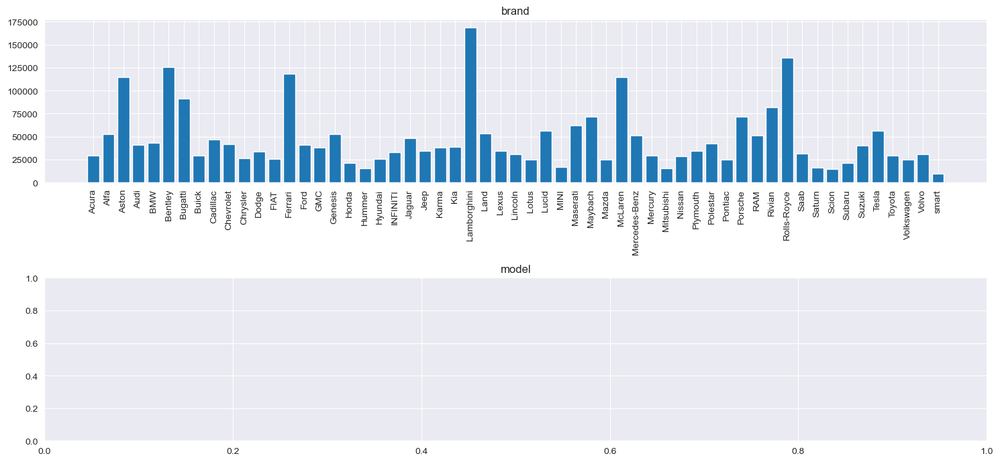

In [258]:
plt.figure( figsize = (15,7) )
plt.subplot(2,1,1)
plt.bar( x =te.categories_[0] , height= te.encodings_[0] )
plt.title(te.feature_names_in_[0])
plt.xticks(rotation = 90)
plt.subplot(2,1,2)
#plt.bar( x =te.categories_[1] , height= te.encodings_[1] )
plt.title(te.feature_names_in_[1])
#plt.xticks(rotation = 90)
plt.tight_layout()

In [259]:
X_train[['brand','model']] = train_encoded

In [264]:
test_encoded = te.transform(X_test[['brand','model']])

In [265]:
X_test[['brand','model']] = test_encoded

In [266]:
df6_test_encoded = te.transform(df6_test[['brand','model']])

In [267]:
df6_test[['brand','model']] = df6_test_encoded

In [270]:
print(' sum of number of rows in df_train, df_test:', len(df_train)+ len(df_test) )
print(' shape of df6_train:', df6_train.shape)
print(' shape of df6_test:', df6_test.shape)
print(' sum of number of rows in X_train, X_test:', len(X_train)+ len(X_test) )

 sum of number of rows in df_train, df_test: 314223
 shape of df6_train: (188533, 13)
 shape of df6_test: (125690, 13)
 sum of number of rows in X_train, X_test: 188533


scaling data using MinMax scaler

In [271]:
sc = MinMaxScaler()

In [273]:
sc.fit(X_train)

MinMaxScaler()

In [274]:
sc_train = sc.transform(X_train)
sc_test = sc.transform(X_test)
sc_df6_test = sc.transform(df6_test)

In [275]:
X_train = pd.DataFrame(sc_train, columns=sc.feature_names_in_, index = X_train.index)
X_test = pd.DataFrame(sc_test, columns=sc.feature_names_in_, index = X_test.index)
df6_test = pd.DataFrame(sc_df6_test, columns=sc.feature_names_in_, index = df6_test.index)

## Test.1 with ridge as our Benchmark Model 
### with the clean modified data df8

In [276]:
from sklearn.linear_model import Ridge, LinearRegression, Lasso

In [277]:
from sklearn.metrics import root_mean_squared_error, mean_absolute_error,r2_score,mean_squared_error

In [278]:
rr = Ridge()

In [279]:
rr.fit(X_train, y_train)

Ridge()

In [280]:
rr_predict = rr.predict(X_test)

In [281]:
r2_score(y_test, rr_predict)

0.141560206337903

In [282]:
rr_predict

array([55213.75477194, 49314.45251824, 32707.53396715, ...,
       12867.47646733, 33443.44542509, 14536.41035301])

In [283]:
root_mean_squared_error(y_test, rr_predict)

67329.55494613394

## Test.2 with ridge as our Benchmark Model 
#### fixing the skewed 'price' column using log1p scaling

In [290]:
skew(y)

20.268291451403694

<Axes: xlabel='price', ylabel='Density'>

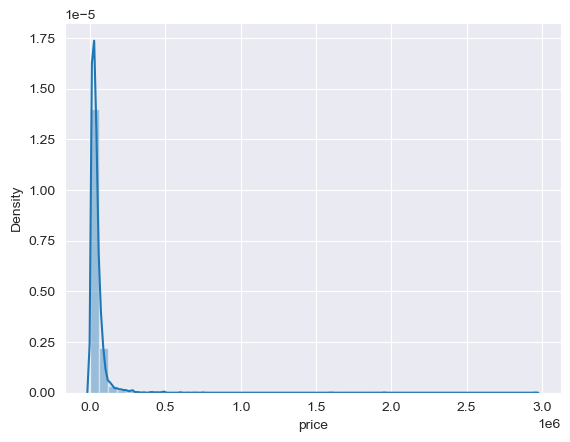

In [288]:
sns.distplot(y)

In [296]:
y_log1p = np.log1p(y)
y_train_log1p = np.log1p(y_train)
y_test_log1p = np.log1p(y_test)

In [297]:
skew(y_log1p)

0.1078628258850152

<Axes: xlabel='price', ylabel='Density'>

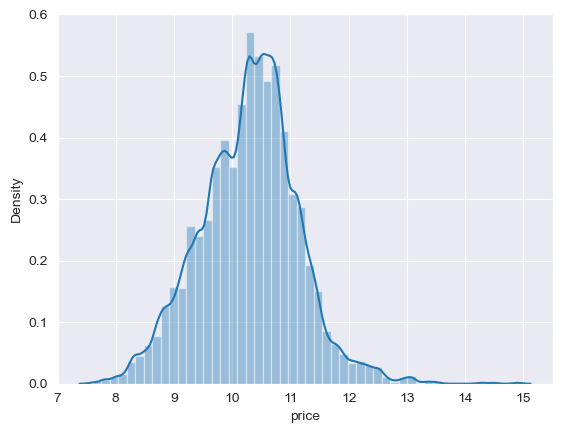

In [298]:
sns.distplot(y_log1p)

In [299]:
rr.fit(X_train, y_train_log1p)

Ridge()

In [300]:
rr_predict = rr.predict(X_test)

In [305]:
r2_score(y_test, np.exp(rr_predict))

0.13595466713249083

In [303]:
rr_predict

array([10.83480936,  9.85123399, 10.14698742, ...,  9.56047539,
       10.03126169,  9.60613887])

In [306]:
root_mean_squared_error(y_test, np.exp(rr_predict))

67549.02539620089

## Test.3 with ridge as our Benchmark Model 
#### removing 'price' column outliers

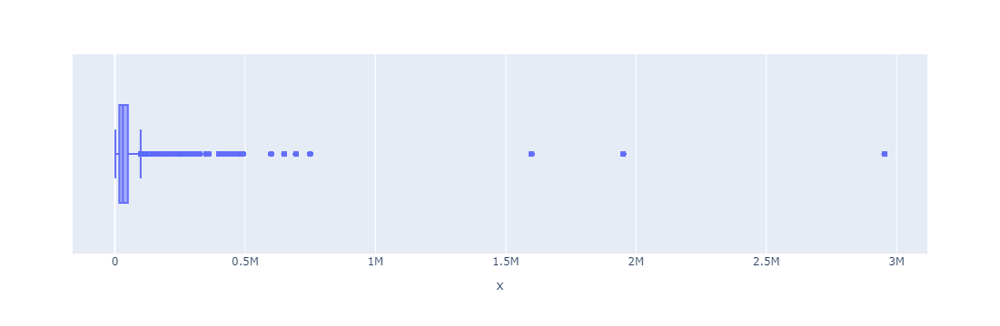

<Figure size 1500x800 with 0 Axes>

In [311]:
plt.figure(figsize = (15,8))
px.box( x = y)

In [309]:
iqr = y.quantile(0.75) - y.quantile(0.25) 
upper_bound = y.quantile(0.75) + 1.5 * iqr
lower_bound = y.quantile(0.25) - 1.5 * iqr
print('IQR :' , iqr)
print('upper boundry for price :' , upper_bound)
print('lower boundry for price :' , lower_bound)

IQR : 32900.0
upper boundry for price : 99250.0
lower boundry for price : -32350.0


In [310]:
print('No price outliers below the lower bound ')
print('Number of price outliers > upper_bound',sum( y > upper_bound))
print('Percentage % of the outliers', round(sum(y > upper_bound) / len(y) * 100,2) , '%')

No price outliers below the lower bound 
Number of price outliers > upper_bound 10880
Percentage % of the outliers 5.77 %


<Axes: >

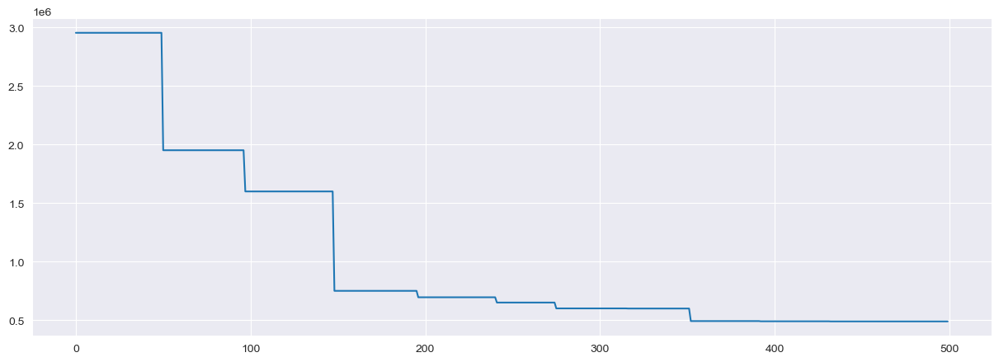

In [323]:
plt.figure(figsize = (15,5))
df.sort_values(by='price', ascending = False).reset_index().head(500)['price'].plot()

In [353]:
print('Percentage % of 150 outliers', round(148 / len(y) * 100,2) , '%')

Percentage % of 150 outliers 0.08 %


<Axes: >

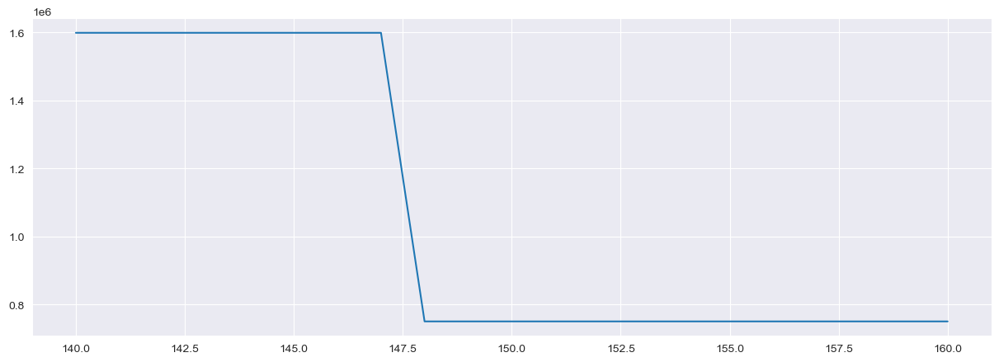

In [328]:
plt.figure(figsize = (15,5))
df.sort_values(by='price', ascending = False).reset_index().loc[140:160]['price'].plot()

In [329]:
df.sort_values(by='price', ascending = False).reset_index().loc[145:150]

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
145,32389,Land,Rover Range Rover Sport SVR Carbon Edition,2022,19250,Gasoline,575.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,9-Speed A/T,Black,Red,None reported,Yes,1599000
146,126306,Porsche,Carrera GT Base,2005,2950,Gasoline,605.0HP 5.7L 10 Cylinder Engine Gasoline Fuel,6-Speed M/T,Gray,Black,None reported,Yes,1599000
147,17859,Land,Rover Range Rover Sport HSE,2019,5844,Gasoline,518.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,1599000
148,121306,GMC,Yukon Denali,2021,21701,Gasoline,6.2L V8 16V GDI OHV,8-Speed Automatic,Chalk,Chestnut,At least 1 accident or damage reported,NaN,749950
149,67305,Land,Rover Defender X-Dynamic SE,2020,37161,Gasoline,5.0L V8 32V GDI DOHC Supercharged,7-Speed Automatic with Auto-Shift,Black Forest Green,Hotspur,None reported,Yes,749950
150,86954,RAM,1500 Laramie,2023,1087,Gasoline,6.4L V8 16V MPFI OHV,8-Speed Automatic,Quartzite Grey Metallic,Black,None reported,NaN,749950


We will drop instances whose prices are 1,599,000 and above to be considered as outliers

In [330]:
len(df[df['price'] >= 1599000])

148

In [331]:
temp_indices = df[df['price'] >= 1599000].index

In [335]:
len(temp_indices)

148

remove the above indices from data train-test splits

In [334]:
X1_train = X_train.copy()
X1_test  = X_test.copy()
y1_train = y_train.copy()
y1_test  = y_test.copy()

In [338]:
for i in temp_indices:
    if i in X1_train.index:
        X1_train.drop( i , axis = 0 , inplace = True)
        y1_train.drop( i , axis = 0 , inplace = True)
    elif i in X1_test.index:
        X1_test.drop( i , axis = 0 , inplace = True)
        y1_test.drop( i , axis = 0 , inplace = True)        
    else:
        print(i)

In [341]:
print(' sum of number of rows in X_train, X_test:', len(X_train)+ len(X_test) )
print(' sum of number of rows in X1_train, X1_test, 148:', len(X1_train)+ len(X1_test)+148 )

 sum of number of rows in X_train, X_test: 188533
 sum of number of rows in X1_train, X1_test, 148: 188533


<Axes: xlabel='price', ylabel='Density'>

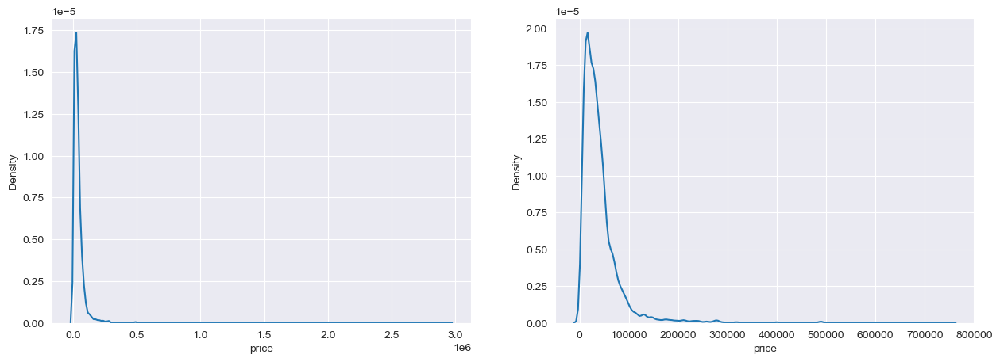

In [367]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.kdeplot(y)
plt.subplot(1,2,2)
sns.kdeplot(pd.concat([y1_train,y1_test], axis = 0))

In [484]:
rr1 = Ridge()

In [485]:
rr1.fit(X1_train, y1_train)

Ridge()

In [487]:
rr1_predict = rr1.predict(X1_test)

In [488]:
r2_score(y1_test, rr_predict)

0.27748781793647725

In [489]:
root_mean_squared_error(y1_test, rr_predict)

42118.86738756478

In [490]:
mean_absolute_error(y1_test, rr_predict)

19807.696346661876

In [ ]:
pred_sub =rr1.predict(X1_)

In [491]:
df6_test.shape

(125690, 13)

In [492]:
df6_test.head(2)

,brand,model,car_age,milage,fuel_type,transmission,ext_col,int_col,accident,clean_title,hp,liters,cylinder
id,,,,,,,,,,,,,
188533,0.246289,0.073120,0.18,0.241788,0.500000,0.714286,0.956522,0.000000,1.0,1.0,0.173729,0.238095,0.25
188534,0.246289,0.231003,0.08,0.022331,0.666667,0.857143,0.826087,0.058824,1.0,1.0,0.337924,0.000000,0.00


Making our first submission

In [493]:
sub1 = rr1.predict(df6_test)

In [506]:
submission_1 = pd.read_csv('sample_submission.csv',index_col='id')

In [507]:
print(len(sub1) , len(submission_1))

125690 125690


In [508]:
submission_1['price'] = sub1

In [510]:
submission_1.to_csv('submission_1.csv')

plotting feature variation to see if we will implement variation threshold feature selection

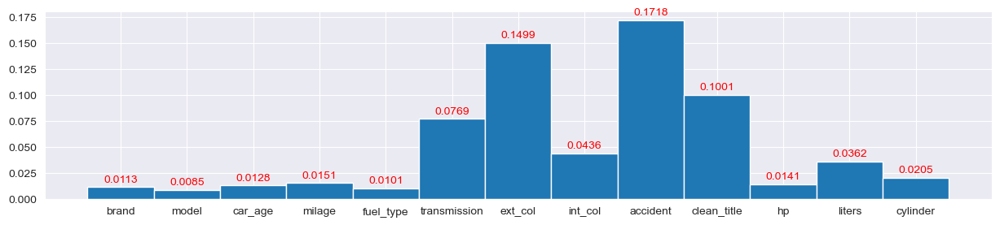

In [410]:
plt.figure(figsize=(15,3))
plt.bar(x = X1_train.var(axis = 0).index, height = X1_train.var(axis = 0),width=1)
#plt.xticks(color = 'white')
for i,v in enumerate(X1_train.var(axis = 0).index):
    plt.text(x = i , y = X1_train.var(axis = 0)[i]+0.005 , s =str(round(X1_train.var(axis = 0)[i],4)) , ha= 'center',color = 'red' )

## implementing Feature selection, testing the dropping of each feature

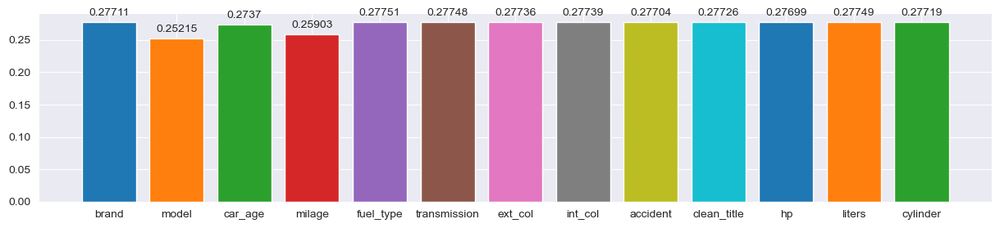

In [428]:
plt.figure(figsize=(15,3))
for i,f in enumerate( X1_train.columns ):
    rr.fit( X1_train.drop(f , axis=1) , y1_train )
    r2 = r2_score( y1_test , rr.predict(X1_test.drop(f , axis=1)))
    plt.bar( f , r2 )
    plt.text(x=i, y=r2+0.01, s=str(round(r2,5)), ha='center')

dropping one feature did not improve performance

checkig te correlation matrrix after scaling and outliers removal

In [475]:
X_temp = pd.concat([X1_train,X1_test], axis= 0)
y_temp = pd.concat([y1_train,y1_test], axis= 0)
df_temp = pd.concat([X_temp,y_temp], axis= 1)

df_corr =df_temp.corr()

mask = np.triu(np.ones_like(df_corr)).astype(bool)

<Axes: >

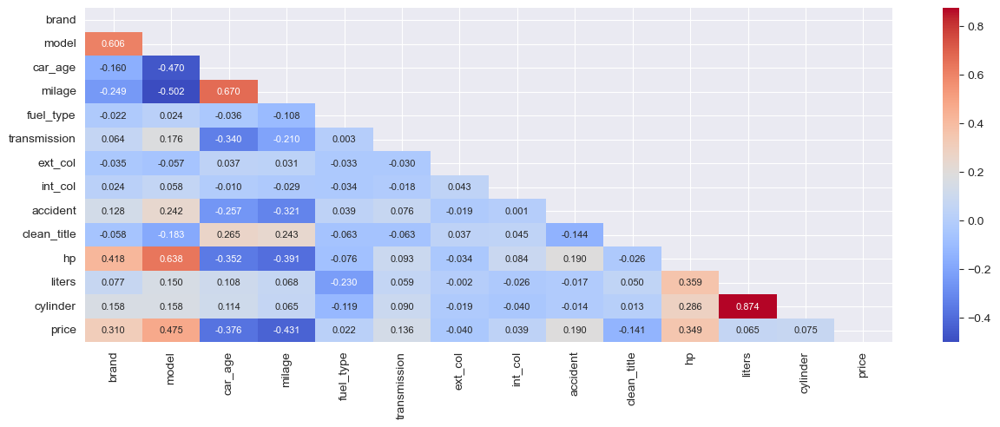

In [476]:
plt.figure(figsize=(15,5))
sns.heatmap(data = df_corr, cmap= 'coolwarm', mask=mask, annot = True, annot_kws={'size':8}, fmt='.3f')

In [480]:
df.isna().sum()

brand               0
model               0
model_year          0
milage              0
fuel_type        5083
engine              0
transmission        0
ext_col             0
int_col             0
accident         2452
clean_title     21419
price               0
dtype: int64

In [481]:
df[['clean_title', 'accident']].value_counts()

clean_title  accident                              
Yes          None reported                             126687
             At least 1 accident or damage reported     40413
Name: count, dtype: int64

In [482]:
df[['clean_title']].value_counts()

clean_title
Yes            167114
Name: count, dtype: int64

In [483]:
df[['accident']].value_counts()

accident                              
None reported                             144514
At least 1 accident or damage reported     41567
Name: count, dtype: int64

## Test.4 XGBoost

In [370]:
from xgboost import XGBRegressor

In [371]:
xgb = XGBRegressor()

In [372]:
xgb.fit(X1_train, y1_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [373]:
xgb_predict = xgb.predict(X1_test)

In [375]:
r2_score(y1_test, xgb_predict)

0.3068223287645293

In [376]:
root_mean_squared_error(y1_test, xgb_predict)

41254.97986293647

In [377]:
mean_absolute_error(y1_test, xgb_predict)

17597.229834974794

In [511]:
sub2 = xgb.predict(df6_test)

In [512]:
submission_2 = pd.read_csv('sample_submission.csv',index_col='id')

In [513]:
print(len(sub2) , len(submission_2))

125690 125690


In [514]:
submission_2['price'] = sub2

In [515]:
submission_2.to_csv('submission_2.csv')

## Test.5 Randomforest

In [516]:
from sklearn.ensemble import RandomForestRegressor

In [517]:
rfr = RandomForestRegressor()

In [518]:
rfr.fit(X1_train,y1_train)

RandomForestRegressor()

In [519]:
rfr_predict = rfr.predict(X1_test)

In [520]:
r2_score(y1_test,rfr_predict)

0.2835765525647296

In [521]:
root_mean_squared_error(y1_test,rfr_predict)

41941.02043237253

In [522]:
mean_absolute_error(y1_test,rfr_predict)

18595.85066896114

In [529]:
sub3 = rfr.predict(df6_test)

In [530]:
submission_3 = pd.read_csv('sample_submission.csv',index_col='id')

In [531]:
print(len(sub3) , len(submission_3))

125690 125690


In [532]:
submission_3['price'] = sub3

In [533]:
submission_3.to_csv('submission_3.csv')

## Test.5 Randomforest

In [535]:
from sklearn.ensemble import GradientBoostingRegressor

In [536]:
gbr = GradientBoostingRegressor()

In [537]:
gbr.fit(X1_train,y1_train)

GradientBoostingRegressor()

In [538]:
gbr_predict = gbr.predict(X1_test)

In [539]:
r2_score(y1_test,gbr_predict)

0.3305657002351402

In [540]:
root_mean_squared_error(y1_test,gbr_predict)

40542.27147302492

In [541]:
mean_absolute_error(y1_test,gbr_predict)

17345.407948914628

In [542]:
sub4 = gbr.predict(df6_test)

In [543]:
submission_4 = pd.read_csv('sample_submission.csv',index_col='id')

In [544]:
print(len(sub4) , len(submission_4))

125690 125690


In [545]:
submission_4['price'] = sub4

In [546]:
submission_4.to_csv('submission_4.csv')